Data set from https://www.physionet.org/content/eegmmidb/1.0.0/ recordings from 109 volunteers 

This file is visualization every process in signal processing

### **Experiment Protocol**

performed 14 experimental runs:
1. **one-minute** baseline runs with eyes open.
2. **one-minute** baseline runs with eyes closed.
3. Task 1 : **two-minute** open and close left or right fist
4. Task 2 : **two-minute** imagine opening and closing left or right fist
5. Task 3 : **two-minute** open and close both fists or both feet
6. Task 4 : **two-minute** imagine opening and closing both fists or both feet
7. Task 1
8. Task 2
9. Task 3
10. Task 4
11. Task 1
12. Task 2
13. Task 3
14. Task 4

**Annotation three codes** (T0, T1, or T2):
- T0 corresponds to rest
- T1 corresponds to onset of motion (real or imagined) of
    - the left fist (in runs 3, 4, 7, 8, 11, and 12)
    - both fists (in runs 5, 6, 9, 10, 13, and 14)
- T2 corresponds to onset of motion (real or imagined) of
    - the right fist (in runs 3, 4, 7, 8, 11, and 12)
    - both feet (in runs 5, 6, 9, 10, 13, and 14)

# **Offline processing of Motor Imagery**

## **Pre-Processing**

### **Load Data**

In [1]:
%matplotlib inline
import mne
import os
import pyedflib
import pandas as pd
import numpy as np
import seaborn as sns
from mne.io import read_raw_edf, RawArray, concatenate_raws
from mne.stats import permutation_cluster_1samp_test as pcluster_test
import warnings
import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm

In [2]:
# --- Data Details --- 
subject_id = ["001"]
task_id = ["04", "08", "12"]

# --- Set Montage ---
montage_name = 'standard_1020'

# --- Set Channels Select ---
chans_selected = ['C5','C3','C1','Cz','C2','C4','C6']

In [3]:
# --- Dataset Path --- 
dataset_path = "Online Dataset/eeg-motor-movementimagery-dataset-1.0.0/files"

# --- Full Path ---
filenames = []
for i in range(len(subject_id)):
    for j in range(len(task_id)):
        filenames.append("S"+subject_id[i]+"/S"+subject_id[i]+"R"+task_id[j]+".edf")
        
path = [os.path.join(dataset_path, filename).replace("\\", "/") for filename in filenames]

# --- Read EDF Files ---
subject_raws = []
for file_path in path:
    with warnings.catch_warnings():
        warnings.filterwarnings("ignore", category=RuntimeWarning)
        data = mne.io.read_raw_edf(file_path, preload=True, verbose=False)
    subject_raws.append(data)

print("Path:",path)
raws_data = concatenate_raws(subject_raws)
print("RawEDF data:", raws_data)

# --- Check Signal Channels ---
with pyedflib.EdfReader(path[-1]) as edf_file:
    signal_labels = edf_file.getSignalLabels()
    print("signal_channels:", signal_labels)

Path: ['Online Dataset/eeg-motor-movementimagery-dataset-1.0.0/files/S001/S001R04.edf', 'Online Dataset/eeg-motor-movementimagery-dataset-1.0.0/files/S001/S001R08.edf', 'Online Dataset/eeg-motor-movementimagery-dataset-1.0.0/files/S001/S001R12.edf']
RawEDF data: <RawEDF | S001R04.edf, 64 x 60000 (375.0 s), ~29.4 MB, data loaded>
signal_channels: ['Fc5.', 'Fc3.', 'Fc1.', 'Fcz.', 'Fc2.', 'Fc4.', 'Fc6.', 'C5..', 'C3..', 'C1..', 'Cz..', 'C2..', 'C4..', 'C6..', 'Cp5.', 'Cp3.', 'Cp1.', 'Cpz.', 'Cp2.', 'Cp4.', 'Cp6.', 'Fp1.', 'Fpz.', 'Fp2.', 'Af7.', 'Af3.', 'Afz.', 'Af4.', 'Af8.', 'F7..', 'F5..', 'F3..', 'F1..', 'Fz..', 'F2..', 'F4..', 'F6..', 'F8..', 'Ft7.', 'Ft8.', 'T7..', 'T8..', 'T9..', 'T10.', 'Tp7.', 'Tp8.', 'P7..', 'P5..', 'P3..', 'P1..', 'Pz..', 'P2..', 'P4..', 'P6..', 'P8..', 'Po7.', 'Po3.', 'Poz.', 'Po4.', 'Po8.', 'O1..', 'Oz..', 'O2..', 'Iz..']


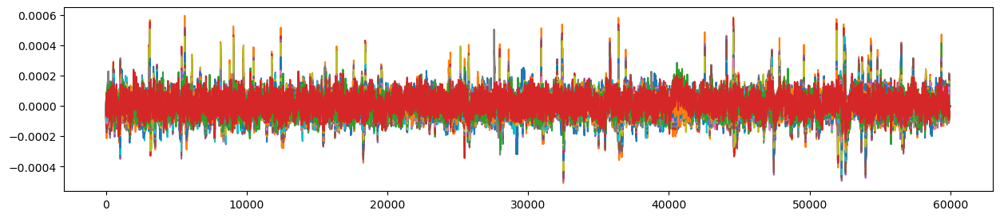

In [4]:
# --- Plot Raw Data in Time Domain ---
# raws_data.plot()
data = raws_data.get_data()
plt.figure(figsize=(15,3))
plt.plot(data.T)

Effective window size : 12.800 (s)


C:\Users\user\AppData\Local\Temp\ipykernel_36288\2751059171.py:2: RuntimeWarning: Channel locations not available. Disabling spatial colors.
  raws_data.compute_psd().plot();
c:\Anaconda\lib\site-packages\mne\viz\utils.py:165: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


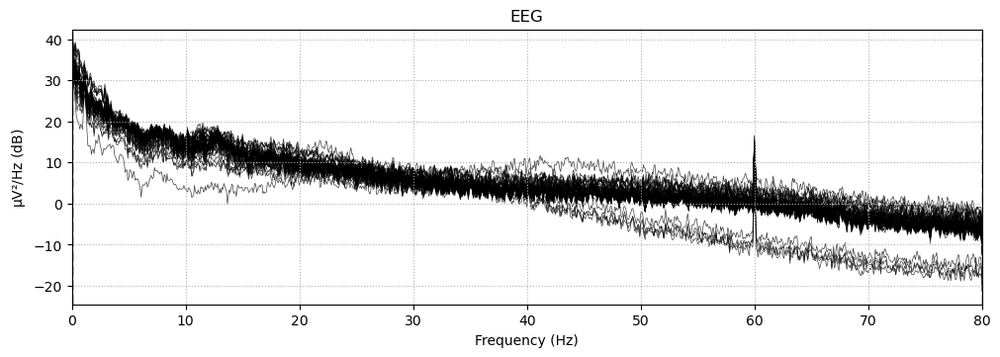

In [5]:
# --- Plot Raw Data in Frequency Domain ---
raws_data.compute_psd().plot();

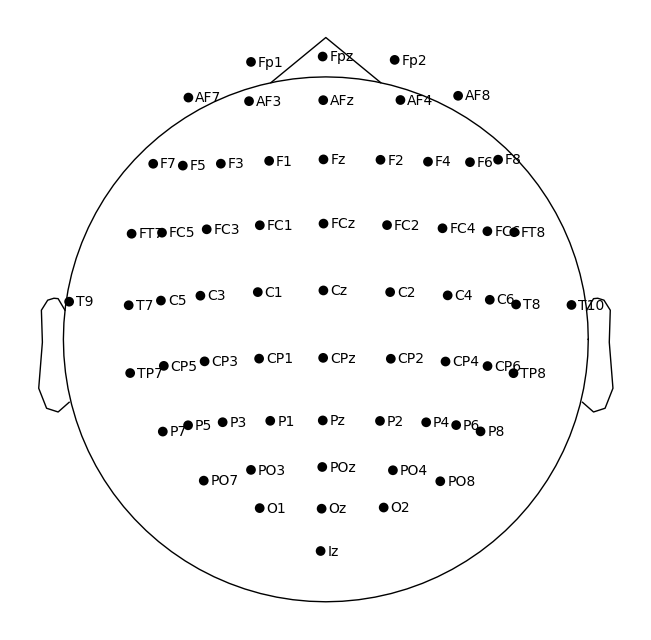

In [6]:
with open("Online Dataset/eeg-motor-movementimagery-dataset-1.0.0/files/wfdbcal", "r") as file:
    content = file.readlines()
    
chan_name = []
chan_order = []
chan_mapping = {}
order = 1
for line in content:
    parts = line.split('\t')
    channel_name = parts[0].strip()
    channel_name = channel_name.replace(".", "")
    chan_name.append(channel_name)
    order_name = "# " + str(order)
    chan_order.append(order_name)
    chan_mapping[order_name] = channel_name
    order += 1 

channel_names = [chan_mapping[f'# {i+1}'] for i in range(64)]
old_ch_names = raws_data.info['ch_names']

raws_data.rename_channels({old: new for old, new in zip(old_ch_names, channel_names)})

# Set montage
# montage = mne.channels.make_standard_montage('standard_1020')
raws_data.set_montage(montage = mne.channels.make_standard_montage(montage_name))

# Plot channel locations
raws_data.plot_sensors(show_names=True);

Effective window size : 12.800 (s)


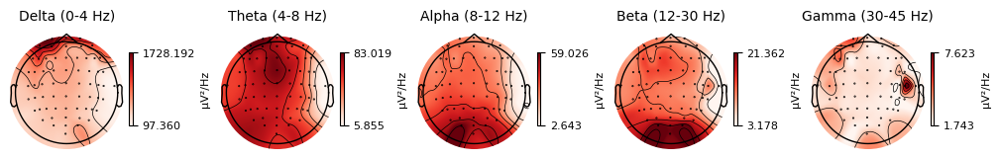

In [7]:
raws_data.compute_psd().plot_topomap();

### **Re-referencing**

Original data of brain signal (64 channels)

Effective window size : 12.800 (s)


c:\Anaconda\lib\site-packages\mne\viz\utils.py:165: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


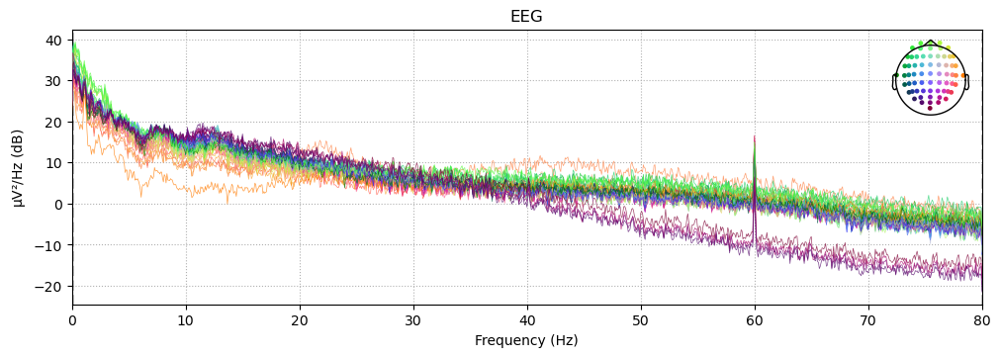

In [8]:
# --- Plot Raw Data in Time Domain ---
raws_data.compute_psd().plot();

**Common Average Reference (CAR)** for re-referancing signal 64 channels

In [9]:
# --- Apply Re-reference by Common Average Reference (CAR) ---
streams = raws_data.copy().set_eeg_reference('average', projection=True)
streams.apply_proj()

EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection items deactivated
Average reference projection was added, but has not been applied yet. Use the apply_proj method to apply it.
Created an SSP operator (subspace dimension = 1)
1 projection items activated
SSP projectors applied...


Measurement date,"August 12, 2009 16:15:00 GMT"
Experimenter,Unknown
Participant,X
Digitized points,67 points
Good channels,64 EEG
Bad channels,None
EOG channels,Not available
ECG channels,Not available
Sampling frequency,160.00 Hz
Highpass,0.00 Hz
Lowpass,80.00 Hz


Once re-referencing is done, it's apparent that there are channels moving closer to other graphs, as seen clearly. For instance, the purple graph overlaps and closely aligns with other graphs significantly.

Effective window size : 12.800 (s)


c:\Anaconda\lib\site-packages\mne\viz\utils.py:165: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


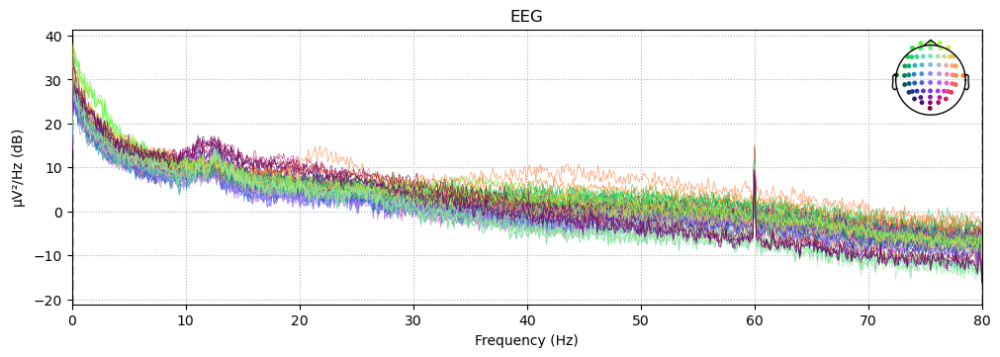

In [10]:
streams.compute_psd().plot();

### **Filtering**

**Infinite Impulse Response (IIR)** for filtering signal
- Butterworth Filters and 6 order
- Low frequency = 8.0
- High frequency = 15.0

In [11]:
stream_filter = streams.copy().filter(l_freq=8.0, h_freq=15.0, method = 'iir', iir_params= {"order": 6, "ftype":'butter'})

Filtering raw data in 3 contiguous segments
Setting up band-pass filter from 8 - 15 Hz



IIR filter parameters
---------------------
Butterworth bandpass zero-phase (two-pass forward and reverse) non-causal filter:
- Filter order 24 (effective, after forward-backward)
- Cutoffs at 8.00, 15.00 Hz: -6.02, -6.02 dB



Effective window size : 12.800 (s)


c:\Anaconda\lib\site-packages\mne\viz\utils.py:165: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


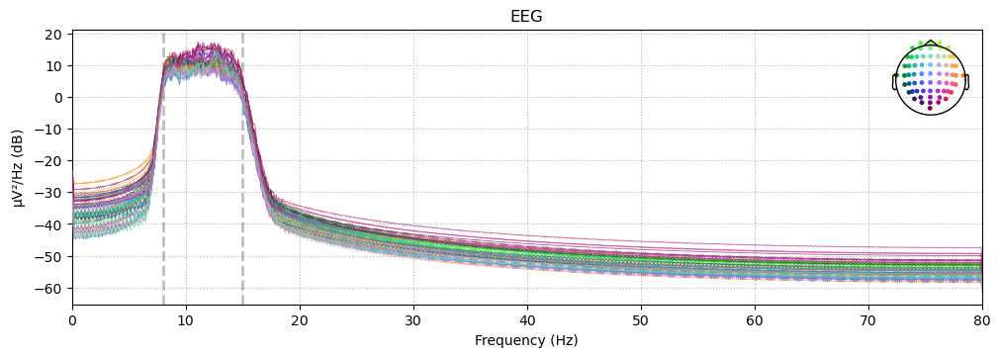

In [12]:
stream_filter.compute_psd().plot();
# stream_filter.plot();

### **Artifact rejection and correction**

**Independent Component Analysis (ICA)** for remove artifact from eye blink or other artifact 

In [13]:
# --- Apply ICA ---
ica = mne.preprocessing.ICA(n_components=63, random_state=97, max_iter=800)
ica.fit(stream_filter.copy())

Fitting ICA to data using 64 channels (please be patient, this may take a while)
    Applying projection operator with 1 vector (pre-whitener computation)
    Applying projection operator with 1 vector (pre-whitener application)
Selecting by number: 63 components
    Applying projection operator with 1 vector (pre-whitener application)
Fitting ICA took 7.7s.


Method,fastica
Fit parameters,algorithm=parallelfun=logcoshfun_args=Nonemax_iter=800
Fit,161 iterations on raw data (60000 samples)
ICA components,63
Available PCA components,64
Channel types,eeg
ICA components marked for exclusion,—


plot topographies of the ICA components to observe and identify which components are likely to be artifacts, in order to use them for removing those specific components, for the purpose of artifact removal

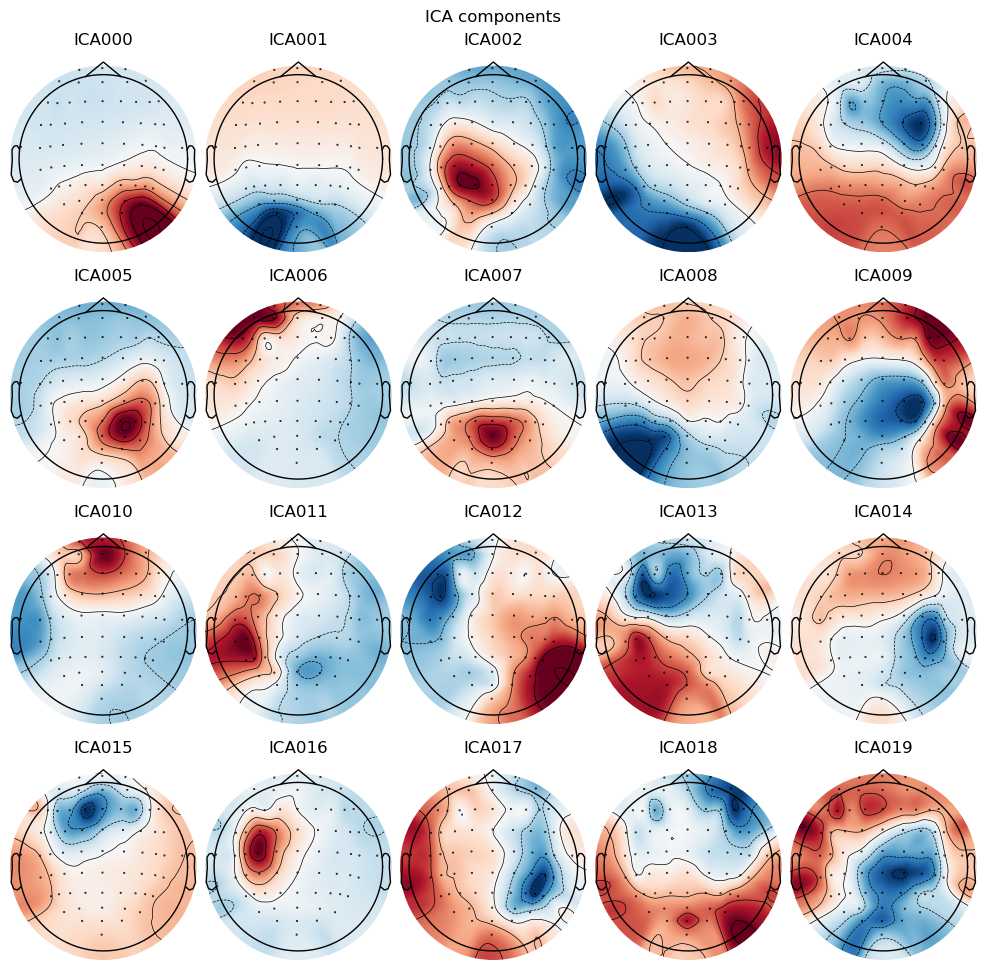

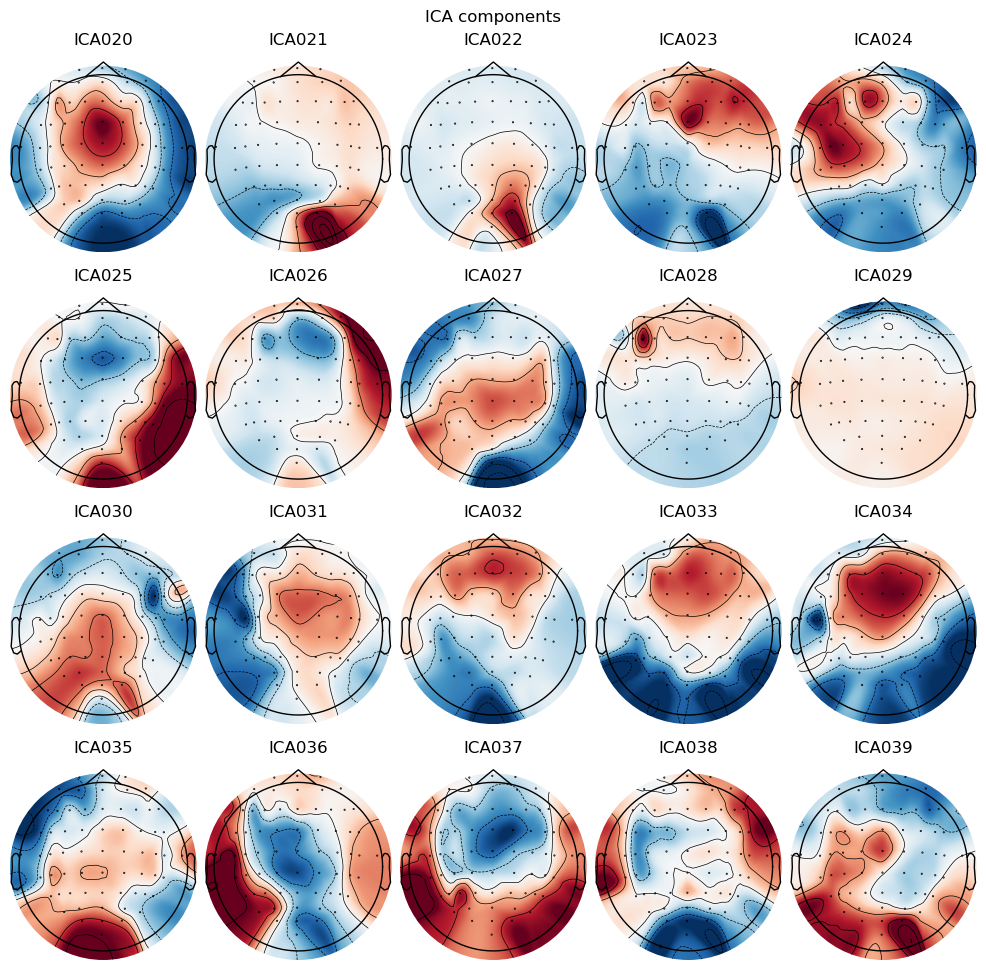

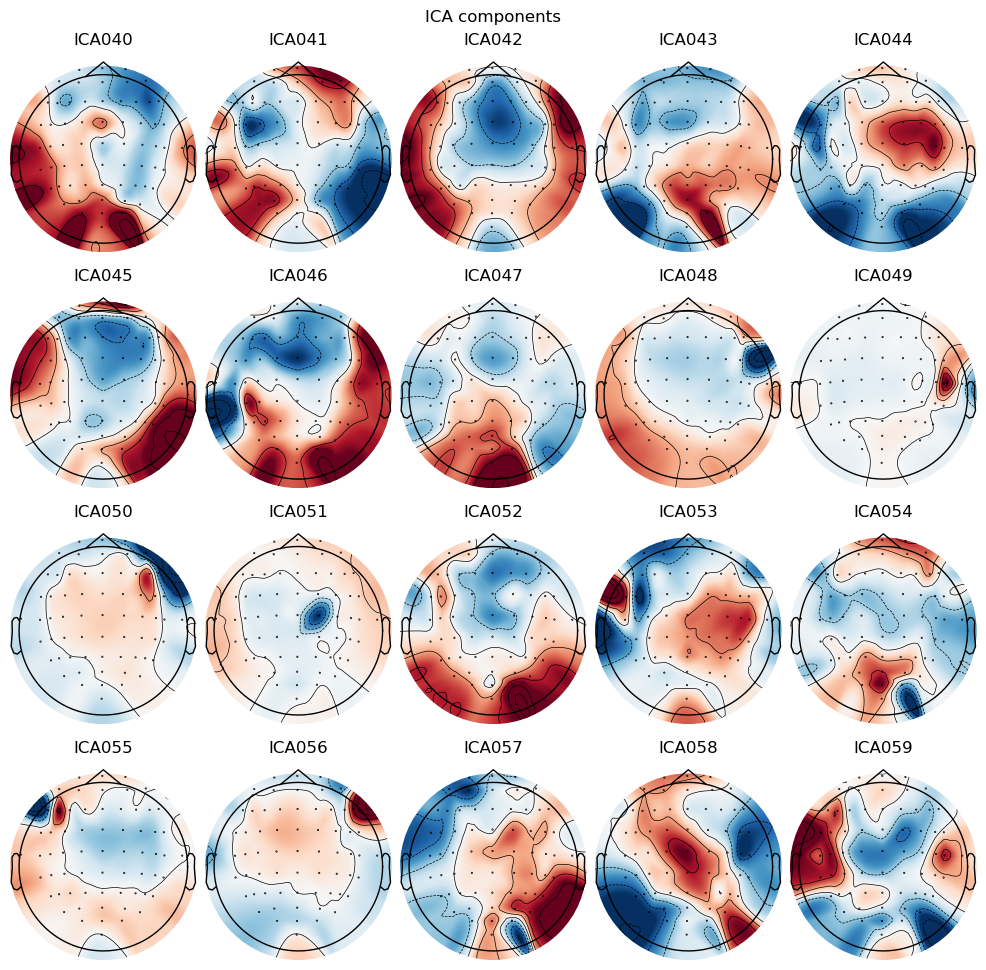

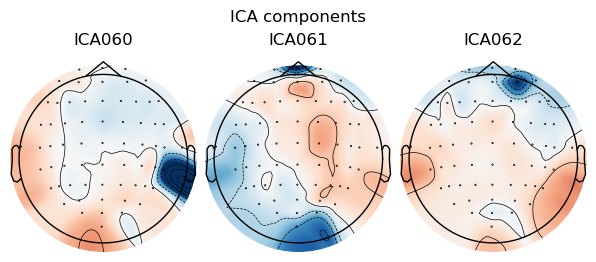

In [14]:
# --- Plot ICA Components ---
ica.plot_components();

Find bad component or artifact component by visual inspection and remove it from the data

In [15]:
# --- Find Bad Components ---
bad_idx, scores = ica.find_bads_eog(stream_filter.copy(), ch_name='T9', threshold=1.5)

Using EOG channel: T9
    Applying projection operator with 1 vector (pre-whitener application)


... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 1600 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 1600 sam

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  63 out of  63 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


In [16]:
# --- Remove Bad Components ---
ica.exclude = bad_idx
print(bad_idx)

# --- Plot ICA Components ---
ica.plot_sources(stream_filter.copy());
#stream_filter.plot();

[3, 12, 2, 17, 20, 27, 10, 15, 35, 42, 7, 40, 0, 31]
    Applying projection operator with 1 vector (pre-whitener application)


Creating RawArray with float64 data, n_channels=63, n_times=60000
    Range : 0 ... 59999 =      0.000 ...   374.994 secs
Ready.
Using qt as 2D backend.


In [17]:
# --- Apply ICA to Filtered Data ---
stream_ica = ica.apply(stream_filter.copy(),exclude=ica.exclude)
#stream_ica.plot();

Applying ICA to Raw instance


    Applying projection operator with 1 vector (pre-whitener application)
    Transforming to ICA space (63 components)
    Zeroing out 14 ICA components
    Projecting back using 64 PCA components


### **Epoch segmentation**

#### **Event marker**

Each event from signal
- T0 = rest
- T1 = Left hand motor imagery
- T2 = Right hand motor imagery

sfreq 160.0
Used Annotations descriptions: ['T0', 'T1', 'T2']
{'T0': 1, 'T1': 2, 'T2': 3}


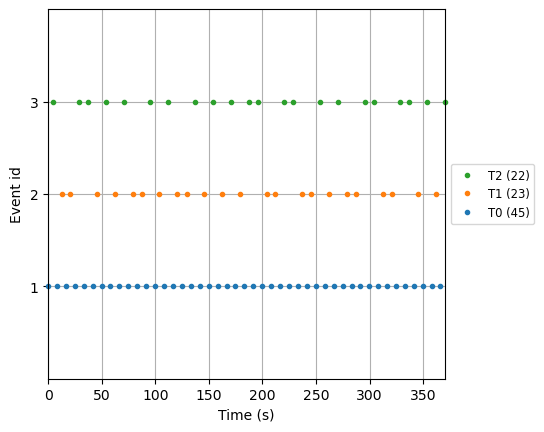

C:\Users\user\AppData\Local\Temp\ipykernel_36288\3407552309.py:13: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


In [18]:
# --- Events ---
print("sfreq", stream_filter.info["sfreq"])
events, event_dict = mne.events_from_annotations(stream_filter)
print(event_dict)

# --- Plot Events ---
fig = mne.viz.plot_events(
    events, sfreq=stream_filter.info["sfreq"], first_samp=stream_filter.first_samp, event_id= event_dict
)
ax = fig.axes[0]
x_lim_seconds = [10, 20]
ax.set_xlim(x_lim_seconds)
fig.show()

#### **Epochs**

In [19]:
# Epoch data based on a subset of interested events
event_selected_mi = {'left': 2, 'right': 3}
event_selected_nonmi = {'rest':1, 'left': 2, 'right': 3}

epochs_mi = mne.Epochs(stream_ica.copy().filter(l_freq=8, h_freq=15.0, method = 'iir', iir_params= {"order": 6, "ftype":'butter'}), events, tmin = -0.5, tmax = 4.5, 
                    event_id = event_selected_mi, preload= True, verbose=False, event_repeated='drop')

epochs_nonmi = mne.Epochs(stream_ica.copy().filter(l_freq=8, h_freq=15.0, method = 'iir', iir_params= {"order": 6, "ftype":'butter'}), events, tmin = -0.5, tmax = 4.5, 
                    event_id = event_selected_nonmi, preload= True, verbose=False, event_repeated='drop')

Filtering raw data in 3 contiguous segments
Setting up band-pass filter from 8 - 15 Hz

IIR filter parameters
---------------------
Butterworth bandpass zero-phase (two-pass forward and reverse) non-causal filter:
- Filter order 24 (effective, after forward-backward)
- Cutoffs at 8.00, 15.00 Hz: -6.02, -6.02 dB

Filtering raw data in 3 contiguous segments
Setting up band-pass filter from 8 - 15 Hz

IIR filter parameters
---------------------
Butterworth bandpass zero-phase (two-pass forward and reverse) non-causal filter:
- Filter order 24 (effective, after forward-backward)
- Cutoffs at 8.00, 15.00 Hz: -6.02, -6.02 dB



In [20]:
epochs_mi
epochs_mi.info

Measurement date,"August 12, 2009 16:15:00 GMT"
Experimenter,Unknown
Participant,X
Digitized points,67 points
Good channels,64 EEG
Bad channels,None
EOG channels,Not available
ECG channels,Not available
Sampling frequency,160.00 Hz
Highpass,8.00 Hz
Lowpass,15.00 Hz


In [21]:
epochs_nonmi
epochs_nonmi.info

Measurement date,"August 12, 2009 16:15:00 GMT"
Experimenter,Unknown
Participant,X
Digitized points,67 points
Good channels,64 EEG
Bad channels,None
EOG channels,Not available
ECG channels,Not available
Sampling frequency,160.00 Hz
Highpass,8.00 Hz
Lowpass,15.00 Hz


In [22]:
epochs_mi.to_data_frame()

,time,condition,epoch,FC5,FC3,FC1,FCz,FC2,FC4,FC6,...,P8,PO7,PO3,POz,PO4,PO8,O1,Oz,O2,Iz
0,-0.50000,right,1,-4.195534,-2.516908,-2.353616,0.003602,0.745893,2.494406,3.939914,...,3.573286,-0.651103,-1.509049,-1.479302,1.298273,5.445527,1.453695,2.217446,16.453101,3.301363
1,-0.49375,right,1,-0.065922,0.603568,0.204667,2.951519,2.257105,3.415353,5.025929,...,0.986070,-5.019320,-6.072792,-6.865807,-5.164140,0.423527,-5.265214,-4.888641,6.283427,-0.990597
2,-0.48750,right,1,3.284118,3.028972,2.267711,4.965467,2.820341,3.318304,5.267435,...,-1.071950,-7.665485,-8.676833,-10.094371,-10.021353,-3.998016,-10.305154,-10.393464,-4.722741,-4.347171
3,-0.48125,right,1,5.074337,4.150448,3.291892,5.496853,2.289263,2.240109,4.539245,...,-2.247387,-7.993151,-8.783669,-10.393047,-12.153853,-6.880641,-12.241888,-12.800183,-13.948325,-5.861528
4,-0.47500,right,1,5.015345,3.777351,3.079284,4.420850,0.877584,0.519261,2.950233,...,-2.467801,-6.073047,-6.550461,-7.801881,-11.151127,-7.735850,-10.555328,-11.496378,-19.308425,-5.224827
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36040,4.47500,right,89,0.104715,-0.008535,-0.284355,-0.747945,-0.733091,-0.753304,-0.491055,...,0.426574,0.176467,0.342478,0.454137,0.442557,0.284429,0.524462,0.650678,0.985634,0.637758
36041,4.48125,right,89,0.238230,0.065803,-0.242231,-0.653836,-0.706299,-0.769539,-0.558187,...,0.156834,-0.008873,0.149915,0.233012,0.196229,0.097938,0.203380,0.335426,0.479140,0.133492
36042,4.48750,right,89,0.365212,0.131480,-0.178300,-0.501422,-0.633754,-0.735618,-0.576777,...,-0.097172,-0.197481,-0.075423,-0.026942,-0.040082,-0.045679,-0.098142,0.027805,-0.040983,-0.337235
36043,4.49375,right,89,0.466694,0.178987,-0.109304,-0.334032,-0.538350,-0.671142,-0.562194,...,-0.298126,-0.363273,-0.292702,-0.268060,-0.225542,-0.130533,-0.333898,-0.217449,-0.480410,-0.703283


In [23]:
# Selected data from only the channels we are interested in
epochs_mi = epochs_mi.pick_channels(chans_selected)
epochs_nonmi = epochs_nonmi.pick_channels(chans_selected)

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


    Using multitaper spectrum estimation with 7 DPSS windows


Averaging across epochs...


c:\Anaconda\lib\site-packages\mne\viz\utils.py:165: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


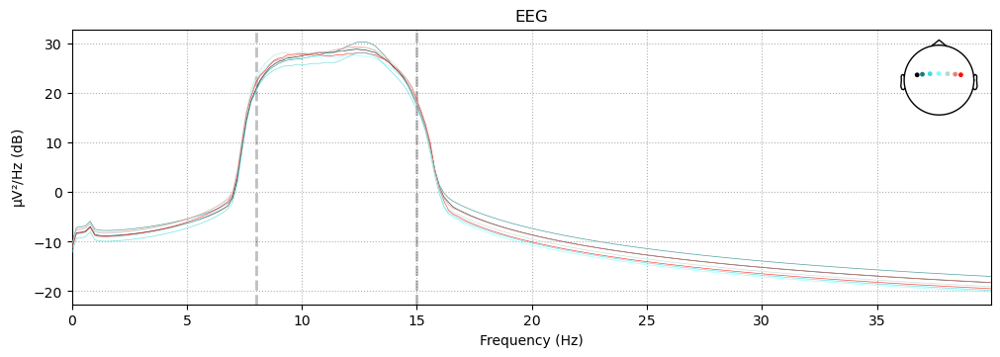

In [24]:
#stream_epochs.plot();
epochs_mi.compute_psd(fmin=0, fmax=40).plot();

### **Baseline Correction**

In [25]:
filt_mi = epochs_mi.copy().filter(l_freq=8.0, h_freq=15.0, method = 'iir', iir_params= {"order": 6, "ftype":'butter'})
filt_nonmi = epochs_nonmi.copy().filter(l_freq=8.0, h_freq=15.0, method = 'iir', iir_params= {"order": 6, "ftype":'butter'})
# filt_mi.plot();
# filt_nonmi.plot();

Setting up band-pass filter from 8 - 15 Hz

IIR filter parameters
---------------------
Butterworth bandpass zero-phase (two-pass forward and reverse) non-causal filter:


- Filter order 24 (effective, after forward-backward)
- Cutoffs at 8.00, 15.00 Hz: -6.02, -6.02 dB

Setting up band-pass filter from 8 - 15 Hz

IIR filter parameters
---------------------
Butterworth bandpass zero-phase (two-pass forward and reverse) non-causal filter:
- Filter order 24 (effective, after forward-backward)
- Cutoffs at 8.00, 15.00 Hz: -6.02, -6.02 dB



In [26]:
stream_mi = filt_mi.copy().apply_baseline((-0.5, 0))
stream_nonmi = filt_nonmi.copy().apply_baseline((-0.5, 0))
stream_mi.plot();

Applying baseline correction (mode: mean)
Applying baseline correction (mode: mean)


### **Bad epochs**

#### **Marking bad epochs**

In [27]:
def mark_bad_epochs(epochs, threshold=200e-6):
    reject = dict(eeg=threshold)
    reject.update({'eeg': 150e-6})
    epochs.drop_bad(reject=reject)
    return epochs

mark_bad_epochs(stream_mi.copy())
mark_bad_epochs(stream_nonmi.copy())

0 bad epochs dropped
0 bad epochs dropped


Number of events,87
Events,left: 23rest: 42right: 22
Time range,-0.500 – 4.500 s
Baseline,-0.500 – 0.000 s


#### **Tuning rejection thresholds**

In [28]:
from ipywidgets import interact

def reject_epochs(reject):
    pick = mne.pick_types(stream_mi.info, meg=False, eeg=True)
    reject = dict(eeg=reject*1e-6)
    evoked = stream_mi.copy().drop_bad(reject=reject, verbose=False).average()
    evoked.plot(spatial_colors=True, gfp=True, time_unit='s')
    print('Number of epochs retained: %d%d' % (evoked.nave, len(stream_mi)))

In [29]:
interact(reject_epochs, reject=(35, 250, 10));

interactive(children=(IntSlider(value=135, description='reject', max=250, min=35, step=10), Output()), _dom_cl…

#### **Autoreject**

In [30]:
import autoreject
from autoreject import get_rejection_threshold

def autoreject_epochs(epochs):
    reject = get_rejection_threshold(epochs)  
    reject.update(reject)
    epochs.drop_bad(reject = reject)
    return epochs

autoreject_epochs(stream_mi.copy())
autoreject_epochs(stream_nonmi.copy())

Estimating rejection dictionary for eeg
0 bad epochs dropped
Estimating rejection dictionary for eeg
0 bad epochs dropped


Number of events,87
Events,left: 23rest: 42right: 22
Time range,-0.500 – 4.500 s
Baseline,-0.500 – 0.000 s


### **Visualization (ERD,ERS)**

In [31]:
from matplotlib.colors import TwoSlopeNorm

ERD_ERS = raws_data.copy()
ERD_ERS.annotations.rename(dict(T1="left", T2="right"))

tmin, tmax = -0.5, 4.0
event_selected = {'left': 2, 'right': 3}  # map event IDs to tasks
event_ids = dict(left=2, right=3)

epochs_ERD_ERS = mne.Epochs(
    ERD_ERS,
    events,
    event_id=event_selected,
    tmin = tmin, tmax = tmax,
    picks=("C3", "Cz", "C4"),
    baseline=None,
    preload=True, verbose=False, event_repeated='drop'
)

In [32]:
freqs = np.arange(2, 36)  # frequencies from 2-35Hz
vmin, vmax = -1, 1.5  # set min and max ERDS values in plot
baseline = (-0.5, 0)  # baseline interval (in s)
cnorm = TwoSlopeNorm(vmin=vmin, vcenter=0, vmax=vmax)  # min, center & max ERDS

kwargs = dict(
    n_permutations=100, step_down_p=0.05, seed=1, buffer_size=None, out_type="mask"
)  # for cluster test

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s


Not setting metadata
Applying baseline correction (mode: percent)
Using a threshold of 1.717144
stat_fun(H1): min=-11.075839 max=7.007803
Running initial clustering …
Found 38 clusters


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.3s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.3s finished


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 1 cluster to exclude from subsequent iterations


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #2 found 0 additional clusters to exclude from subsequent iterations
Using a threshold of -1.717144
stat_fun(H1): min=-11.075839 max=7.007803
Running initial clustering …
Found 9 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 1 cluster to exclude from subsequent iterations


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #2 found 0 additional clusters to exclude from subsequent iterations
No baseline correction applied
Using a threshold of 1.717144
stat_fun(H1): min=-9.604718 max=6.712032
Running initial clustering …
Found 15 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 1 cluster to exclude from subsequent iterations


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #2 found 0 additional clusters to exclude from subsequent iterations
Using a threshold of -1.717144
stat_fun(H1): min=-9.604718 max=6.712032
Running initial clustering …
Found 6 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 1 cluster to exclude from subsequent iterations


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #2 found 0 additional clusters to exclude from subsequent iterations
No baseline correction applied
Using a threshold of 1.717144
stat_fun(H1): min=-8.698380 max=7.156931
Running initial clustering …
Found 14 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 1 cluster to exclude from subsequent iterations


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #2 found 0 additional clusters to exclude from subsequent iterations
Using a threshold of -1.717144
stat_fun(H1): min=-8.698380 max=7.156931
Running initial clustering …
Found 7 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 1 cluster to exclude from subsequent iterations


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #2 found 0 additional clusters to exclude from subsequent iterations
No baseline correction applied


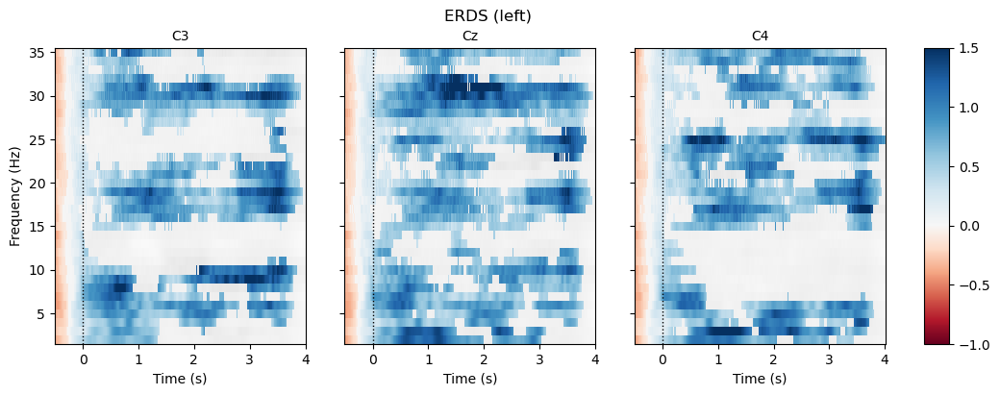

Using a threshold of 1.720743
stat_fun(H1): min=-10.475676 max=7.945132
Running initial clustering …
Found 38 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 2 clusters to exclude from subsequent iterations


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #2 found 0 additional clusters to exclude from subsequent iterations
Using a threshold of -1.720743
stat_fun(H1): min=-10.475676 max=7.945132
Running initial clustering …
Found 5 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 1 cluster to exclude from subsequent iterations


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #2 found 0 additional clusters to exclude from subsequent iterations
No baseline correction applied
Using a threshold of 1.720743
stat_fun(H1): min=-10.548276 max=7.483983
Running initial clustering …
Found 52 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 2 clusters to exclude from subsequent iterations


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #2 found 0 additional clusters to exclude from subsequent iterations
Using a threshold of -1.720743
stat_fun(H1): min=-10.548276 max=7.483983
Running initial clustering …
Found 9 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 1 cluster to exclude from subsequent iterations


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #2 found 0 additional clusters to exclude from subsequent iterations
No baseline correction applied
Using a threshold of 1.720743
stat_fun(H1): min=-9.721366 max=8.295703
Running initial clustering …
Found 19 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 1 cluster to exclude from subsequent iterations


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #2 found 0 additional clusters to exclude from subsequent iterations
Using a threshold of -1.720743
stat_fun(H1): min=-9.721366 max=8.295703
Running initial clustering …
Found 9 clusters


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #1 found 1 cluster to exclude from subsequent iterations


  0%|          | Permuting : 0/99 [00:00<?,       ?it/s]

Step-down-in-jumps iteration #2 found 0 additional clusters to exclude from subsequent iterations
No baseline correction applied


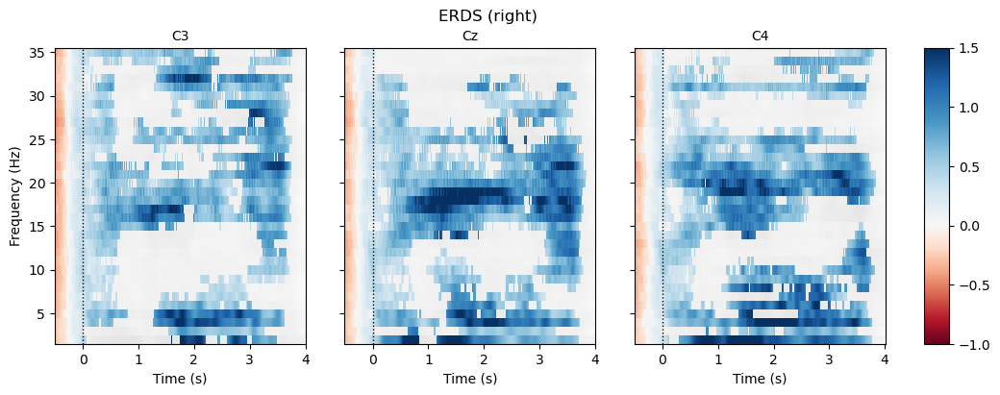

In [33]:
from mne.time_frequency import tfr_multitaper

tfr = tfr_multitaper(
    # method="multitaper",
    inst=epochs_ERD_ERS,
    freqs=freqs,
    n_cycles=freqs,
    use_fft=True,
    return_itc=False,
    average=False,
    decim=2,
)
tfr.crop(tmin, tmax).apply_baseline(baseline, mode="percent")

for event in event_ids:
    # select desired epochs for visualization
    tfr_ev = tfr[event]
    fig, axes = plt.subplots(
        1, 4, figsize=(12, 4), gridspec_kw={"width_ratios": [10, 10, 10, 1]}
    )
    for ch, ax in enumerate(axes[:-1]):  # for each channel
        # positive clusters
        _, c1, p1, _ = pcluster_test(tfr_ev.data[:, ch], tail=1, **kwargs)
        # negative clusters
        _, c2, p2, _ = pcluster_test(tfr_ev.data[:, ch], tail=-1, **kwargs)

        # note that we keep clusters with p <= 0.05 from the combined clusters
        # of two independent tests; in this example, we do not correct for
        # these two comparisons
        c = np.stack(c1 + c2, axis=2)  # combined clusters
        p = np.concatenate((p1, p2))  # combined p-values
        mask = c[..., p <= 0.05].any(axis=-1)

        # plot TFR (ERDS map with masking)
        tfr_ev.average().plot(
            [ch],
            cmap="RdBu",
            cnorm=cnorm,
            axes=ax,
            colorbar=False,
            show=False,
            mask=mask,
            mask_style="mask",
        )

        ax.set_title(epochs_ERD_ERS.ch_names[ch], fontsize=10)
        ax.axvline(0, linewidth=1, color="black", linestyle=":")  # event
        if ch != 0:
            ax.set_ylabel("")
            ax.set_yticklabels("")
    fig.colorbar(axes[0].images[-1], cax=axes[-1]).ax.set_yscale("linear")
    fig.suptitle(f"ERDS ({event})")
    plt.show()

ERD and ERS cannot clearly distinguish between different brain signal patterns, as the brain signals do not exhibit distinct patterns (This dataset may not be as high-quality as expected).

## **Feature Extraction**

### **Common Spatial Pattern (CSP)**

In [31]:
from mne.decoding import CSP
from sklearn.model_selection import train_test_split, cross_val_score

Computing rank from data with rank=None
    Using tolerance 1.8e-06 (2.2e-16 eps * 7 dim * 1.2e+09  max singular value)
    Estimated rank (mag): 7
    MAG: rank 7 computed from 7 data channels with 0 projectors
Reducing data rank from 7 -> 7
Estimating covariance using EMPIRICAL
Done.
Computing rank from data with rank=None
    Using tolerance 1.7e-06 (2.2e-16 eps * 7 dim * 1.1e+09  max singular value)
    Estimated rank (mag): 7
    MAG: rank 7 computed from 7 data channels with 0 projectors
Reducing data rank from 7 -> 7
Estimating covariance using EMPIRICAL
Done.
Computing rank from data with rank=None
    Using tolerance 1.8e-06 (2.2e-16 eps * 7 dim * 1.2e+09  max singular value)
    Estimated rank (mag): 7
    MAG: rank 7 computed from 7 data channels with 0 projectors
Reducing data rank from 7 -> 7
Estimating covariance using EMPIRICAL
Done.
Computing rank from data with rank=None
    Using tolerance 1.7e-06 (2.2e-16 eps * 7 dim * 1.1e+09  max singular value)
    Estimated rank 

C:\Users\user\AppData\Local\Temp\ipykernel_7532\1498245576.py:2: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  X = epochs.get_data()


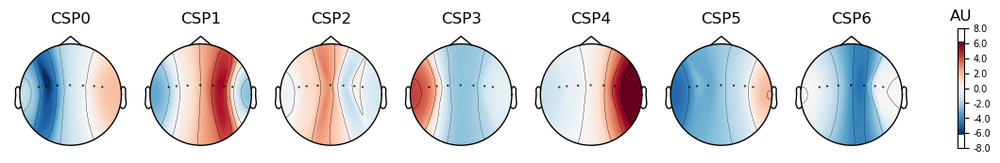

CSP({'component_order': 'mutual_info',
 'cov_est': 'concat',
 'cov_method_params': None,
 'log': None,
 'n_components': 7,
 'norm_trace': False,
 'rank': None,
 'reg': None,
 'transform_into': 'average_power'})
Computing rank from data with rank=None
    Using tolerance 2.6e-06 (2.2e-16 eps * 7 dim * 1.7e+09  max singular value)
    Estimated rank (mag): 7
    MAG: rank 7 computed from 7 data channels with 0 projectors
Reducing data rank from 7 -> 7
Estimating covariance using EMPIRICAL
Done.
Computing rank from data with rank=None
    Using tolerance 1.8e-06 (2.2e-16 eps * 7 dim * 1.2e+09  max singular value)
    Estimated rank (mag): 7
    MAG: rank 7 computed from 7 data channels with 0 projectors
Reducing data rank from 7 -> 7
Estimating covariance using EMPIRICAL
Done.
Computing rank from data with rank=None
    Using tolerance 1.7e-06 (2.2e-16 eps * 7 dim * 1.1e+09  max singular value)
    Estimated rank (mag): 7
    MAG: rank 7 computed from 7 data channels with 0 projectors
Red

C:\Users\user\AppData\Local\Temp\ipykernel_7532\1498245576.py:2: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  X = epochs.get_data()


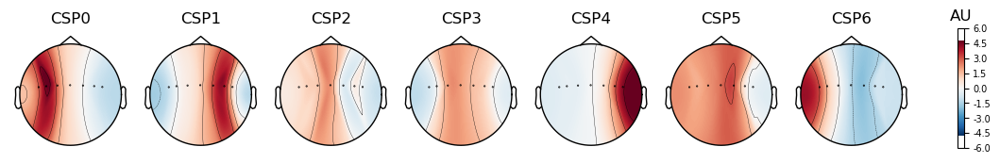

CSP({'component_order': 'mutual_info',
 'cov_est': 'concat',
 'cov_method_params': None,
 'log': None,
 'n_components': 7,
 'norm_trace': False,
 'rank': None,
 'reg': None,
 'transform_into': 'average_power'})


In [32]:
def csp(epochs, n_component = 7): 
    X = epochs.get_data()
    y = epochs.events[:, -1]
    
    # Initilize CSP
    csp = CSP(n_components = n_component, norm_trace=False)
    csp_wt = CSP(n_components = n_component, reg=None, log=None, norm_trace=False, transform_into='csp_space')
    
    # Fit CSP to data 
    csp.fit(X, y)
    csp_wt.fit(X, y)
    
    new_data = csp_wt.transform(X)
    
    # Visualize CSP patterns
    csp.plot_patterns(epochs.info);
    print(csp)
    return X, y, csp, csp_wt, new_data
    
X_mi, y_mi, csp_mi, csp_wt_mi, data_mi = csp(stream_mi.copy(), 7)
X_nonmi, y_nonmi, csp_nonmi, csp_wt_nonmi, data_nonmi = csp(stream_nonmi.copy(),7)

### **Wavelet Transform (WT)**

In [33]:
import pywt

In [34]:
epochs_data = stream_nonmi['rest', 'left', 'right'].get_data()
labels = stream_nonmi['rest', 'left', 'right'].events[:,-1]

print(epochs_data.shape)

(87, 7, 801)


C:\Users\user\AppData\Local\Temp\ipykernel_7532\4201462560.py:1: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  epochs_data = stream_nonmi['rest', 'left', 'right'].get_data()


In [35]:
labels

array([3, 1, 2, 1, 2, 1, 3, 1, 3, 1, 2, 1, 3, 1, 2, 1, 3, 1, 2, 1, 2, 1,
       3, 1, 2, 1, 3, 1, 2, 2, 1, 3, 1, 2, 1, 3, 1, 2, 1, 3, 1, 2, 1, 3,
       1, 3, 1, 2, 1, 2, 1, 3, 1, 3, 1, 2, 1, 2, 3, 1, 2, 1, 3, 1, 2, 1,
       2, 1, 3, 1, 3, 1, 2, 1, 2, 1, 3, 1, 3, 1, 2, 1, 3, 1, 2, 1, 3])

In [36]:
train_size = len(labels)
train_data_cwt = np.ndarray(shape=(train_size ,epochs_data.shape[1] , 8, epochs_data.shape[2],))

In [37]:
scales = range(8,16)

for ii in range(63):
    for jj in range(7):
        signal = data_nonmi[ii, jj, :]
        coeff, _ = pywt.cwt(signal, scales, 'morl', 1)
        coeff_ = coeff[:, :epochs_data.shape[2]]  # (8,epochs_data.shape[2])
        train_data_cwt[ii, jj, :, :] = np.abs(coeff_)  

print(np.shape(coeff),np.shape(coeff_))

(8, 801) (8, 801)


In [38]:
train_data_cwt.shape

(87, 7, 8, 801)

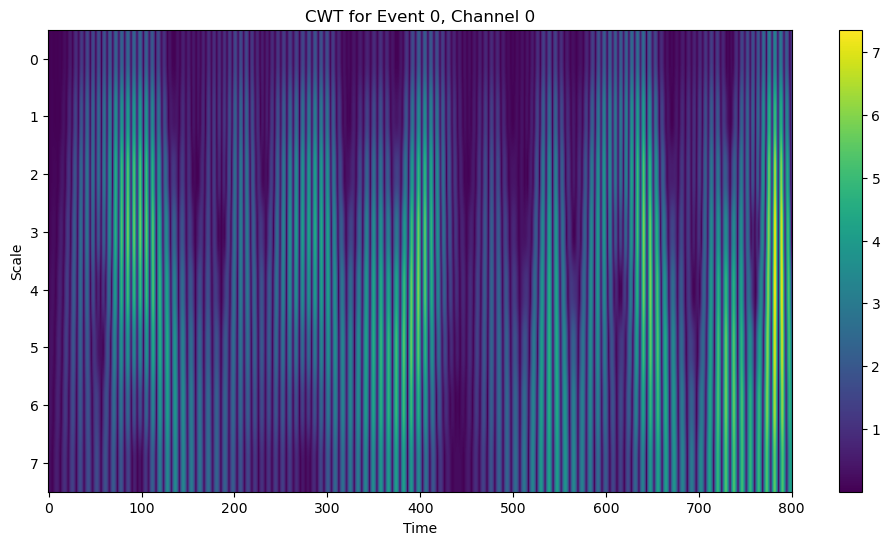

In [39]:
event = 0
channel = 0

# Select the CWT data for the specific event and channel
cwt_slice = train_data_cwt[event, channel, :, :]

# Plot the CWT
plt.figure(figsize=(12, 6))
plt.imshow(cwt_slice, aspect='auto', cmap='viridis')
plt.title(f'CWT for Event {event}, Channel {channel}')
plt.xlabel('Time')
plt.ylabel('Scale')
plt.colorbar()
plt.show()

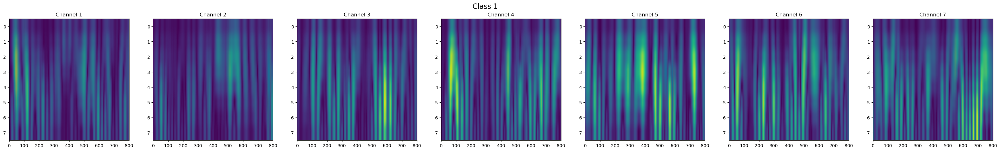

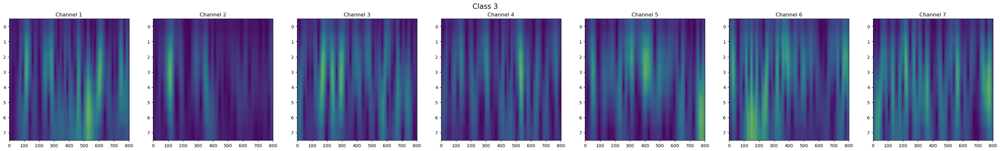

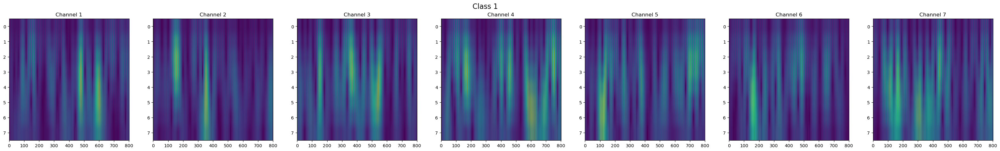

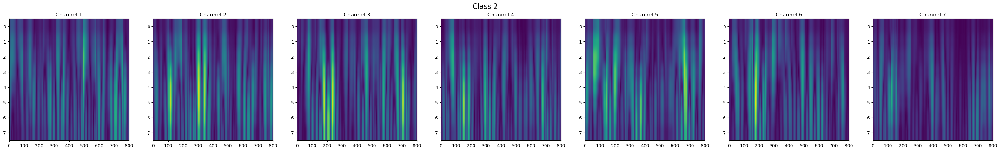

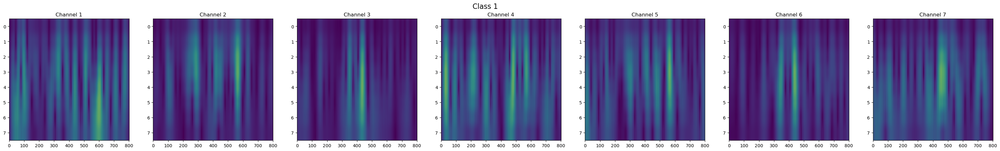

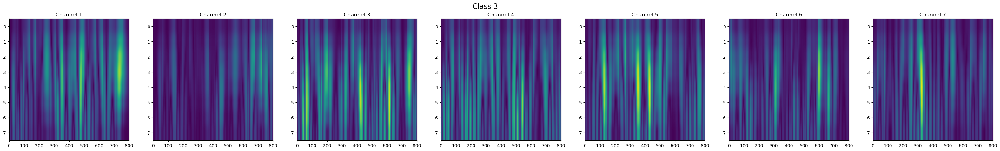

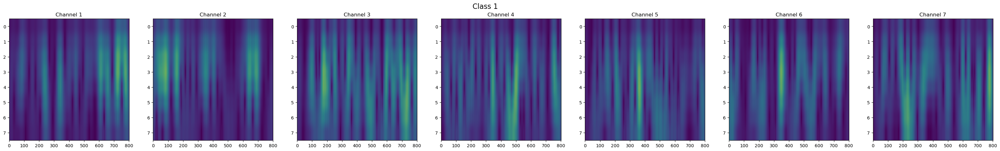

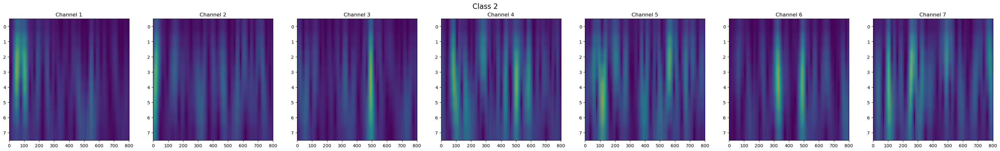

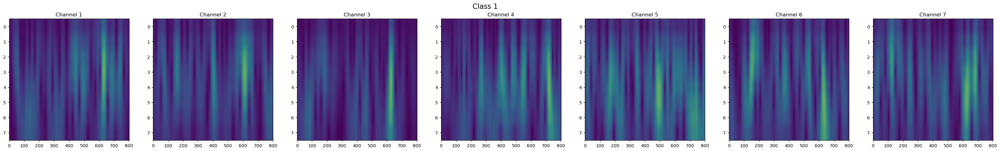

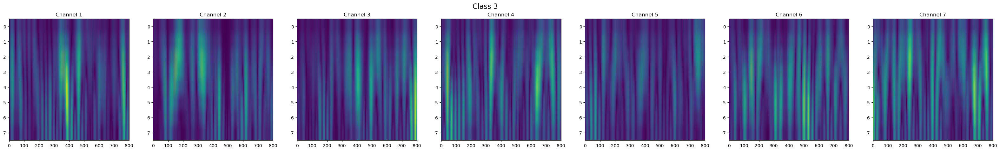

In [172]:
for j in range(30,40,1):
    sample = train_data_cwt[j]
    # Create subplots for each channel with a larger figure size
    fig, axs = plt.subplots(1, 7, figsize=(40, 5))  # Increase the width (20) to make the figure larger
    for i in range(7):
        axs[i].imshow(sample[i], aspect='auto', cmap='viridis')
        axs[i].set_title(f'Channel {i+1}')
    fig.suptitle(f'Class {labels[j]}', fontsize=16)
    plt.show()

## **Feature Selection** 

https://johfischer.com/2021/08/06/correlation-based-feature-selection-in-python-from-scratch/

Use Correlation-based Feature Selection for select feature 

Calculate merit for check correlation between class-feature and feature-feature

In [41]:
from scipy.stats import pointbiserialr
from math import sqrt

def getMerit(subset, label):
    print(subset)
    # average feature-class correlation
    rcf_all = []
    for feature in subset:
        coeff = pointbiserialr( df[label], df[feature] )
        rcf_all.append( abs( coeff.correlation ) )
    rcf = np.mean( rcf_all )

    # average feature-feature correlation
    corr = df[subset].corr()
    corr.values[np.tril_indices_from(corr.values)] = np.nan
    corr = abs(corr)
    rff = corr.unstack().mean()
    
    return (k * rcf) / sqrt(k + k * (k-1) * rff)

In [42]:
import pandas as pd
import numpy as np

X_transformed = csp_nonmi.transform(X_nonmi)

# Assuming X_transformed is a NumPy array
df = pd.DataFrame(X_transformed)
print(df)

# Compute correlation matrix
corr = df.corr()

# corr

           0         1         2         3         4         5         6
0  -0.611869 -0.361533  0.095810 -0.026021  0.366707 -0.236983  0.245105
1  -0.089521 -0.700511  0.062659 -0.111874  0.271417 -0.048711  0.156259
2  -0.656257 -1.008862  0.050372 -0.025574  0.063633  0.276958  0.084422
3   0.140376  0.278955  0.164204  0.017544  0.203074  0.136517  0.303427
4   0.352317 -0.227371 -0.113258  0.366867 -0.073430  0.195635 -0.026871
..       ...       ...       ...       ...       ...       ...       ...
82 -0.979386  0.311248  0.105461 -0.170021  0.109281 -0.065807  0.025953
83  0.026247  0.321170 -0.030262  0.018971  0.096346  0.106577 -0.306609
84 -1.029860 -0.335134  0.091408 -0.397755 -0.195228  0.054688 -0.076525
85 -0.610301  0.390707 -0.048552 -0.103930 -0.447629 -0.247607 -0.150925
86 -0.629682  0.045895 -0.333729 -0.584898 -0.302285 -0.043251 -0.516151

[87 rows x 7 columns]


In [43]:
corr.values[np.tril_indices_from(corr.values)] = np.nan
corr

,0,1,2,3,4,5,6
0,NaN,0.496597,0.089122,0.603245,0.393358,0.081244,0.358690
1,NaN,NaN,0.039119,0.332476,0.495824,0.075600,0.068327
2,NaN,NaN,NaN,0.049293,-0.036127,0.265921,0.077130
3,NaN,NaN,NaN,NaN,0.402984,0.180082,0.266670
4,NaN,NaN,NaN,NaN,NaN,0.081648,0.334448
5,NaN,NaN,NaN,NaN,NaN,NaN,0.174969
6,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [44]:
df = df.assign(Class = y_nonmi)

# name of the label (can be seen in the dataframe)
label = 'Class'

# list with feature names (V1, V2, V3, ...)
features = df.columns.tolist()
features.remove(label)
print(features)

# change class labeling to 0 and 1
# df[label] = np.where( df[label] > 2, 1, 0)
df.head()

[0, 1, 2, 3, 4, 5, 6]


,0,1,2,3,4,5,6,Class
0,-0.611869,-0.361533,0.095810,-0.026021,0.366707,-0.236983,0.245105,3
1,-0.089521,-0.700511,0.062659,-0.111874,0.271417,-0.048711,0.156259,1
2,-0.656257,-1.008862,0.050372,-0.025574,0.063633,0.276958,0.084422,2
3,0.140376,0.278955,0.164204,0.017544,0.203074,0.136517,0.303427,1
4,0.352317,-0.227371,-0.113258,0.366867,-0.073430,0.195635,-0.026871,2


In [45]:
best_value = -1
best_feature = ''
for feature in features:
    coeff = pointbiserialr( df[label], df[feature] )
    abs_coeff = abs( coeff.correlation )
    if abs_coeff > best_value:
        best_value = abs_coeff
        best_feature = feature

print("Feature %s with merit %.4f"%(best_feature, best_value))

Feature 0 with merit 0.4663


In [46]:
class PriorityQueue:
    def  __init__(self):
        self.queue = []

    def isEmpty(self):
        return len(self.queue) == 0
    
    def push(self, item, priority):
        for index, (i, p) in enumerate(self.queue):
            if (set(i) == set(item)):
                if (p >= priority):
                    break
                del self.queue[index]
                self.queue.append( (item, priority) )
                break
        else:
            self.queue.append( (item, priority) )
        
    def pop(self):
        # return item with highest priority and remove it from queue
        max_idx = 0
        for index, (i, p) in enumerate(self.queue):
            if (self.queue[max_idx][1] < p):
                max_idx = index
        (item, priority) = self.queue[max_idx]
        del self.queue[max_idx]
        return (item, priority)

In [47]:
# initialize queue
queue = PriorityQueue()

# push first tuple (subset, merit)
queue.push([best_feature], best_value)

In [48]:
# list for visited nodes
visited = []

# counter for backtracks
n_backtrack = 0

# limit of backtracks
max_backtrack = 5

In [50]:
# repeat until queue is empty
# or the maximum number of backtracks is reached
while not queue.isEmpty():
    # get element of queue with highest merit
    subset, priority = queue.pop()
    
    # check whether the priority of this subset
    # is higher than the current best subset
    if (priority < best_value):
        n_backtrack += 1
    else:
        best_value = priority
        best_subset = subset

    # goal condition
    if (n_backtrack == max_backtrack):
        break
    
    # iterate through all features and look of one can
    # increase the merit
    for feature in features:
        temp_subset = subset + [feature]
        
        # check if this subset has already been evaluated
        for node in visited:
            if (set(node) == set(temp_subset)):
                break
        # if not, ...
        else:
            # ... mark it as visited
            visited.append( temp_subset )
            # ... compute merit
            merit = getMerit(temp_subset, label)
            
            # and push it to the queue
            queue.push(temp_subset, merit)

In [51]:
from sklearn.model_selection import cross_val_score
from sklearn import svm
from sklearn.metrics import classification_report
import time

# predictors
X = df[features].to_numpy()
# target
Y = df[label].to_numpy()

# get timing
t0 = time.time()

# run SVM with 10-fold cross validation
svc = svm.SVC(kernel='rbf', C=100, gamma=0.01, random_state=42)
scores = cross_val_score(svc, X, Y, cv=10)
best_score = np.mean( scores )

print("Score: %.2f%% (Time: %.4f s)"%(best_score*100, time.time() - t0))

Score: 64.58% (Time: 0.0216 s)


In [52]:
# predictors
print(best_subset)
best_subset = [0,1]
X = df[best_subset].to_numpy()

# get timing
t0 = time.time()

# run SVM with 10-fold cross validation
svc = svm.SVC(kernel='rbf', C=100, gamma=0.01, random_state=42)
scores_subset = cross_val_score(svc, X, Y, cv=10)
best_score = np.mean( scores_subset )

print("Score: %.2f%% (Time: %.4f s)"%(best_score*100, time.time() - t0))


[0]
Score: 59.86% (Time: 0.0235 s)


In [53]:
# print(best_subset)

# df_copy = df.copy()

# # Define colors for each class
# colors = {0: 'green', 1: 'red'}

# # Plot the points with different colors based on the class
# for label, color in colors.items():
#     plt.scatter(df_copy[df_copy['Class'] == label][0], df_copy[df_copy['Class'] == label][1], color=color, label=f'Class {label}', marker='o')

# # Set labels and title
# plt.xlabel('Feature 0')
# plt.ylabel('Feature 1')
# plt.title('Scatter Plot of Features 0 and 1 by Class')

# # Add legend
# plt.legend()
# # Show plot
# plt.show()

### **minimum Redundancy - Maximum Relevance (mRMR)**

In [54]:
import mrmr
from mrmr import mrmr_classif

In [55]:
# predictors
X = df[features].to_numpy()
X = pd.DataFrame(X)
# target
Y = df[label].to_numpy()
y = pd.Series(Y)

selected_features = mrmr_classif(X=X, y=y, K=2)
selected_features

100%|██████████| 2/2 [00:00<00:00,  2.12it/s]


[0, 2]

In [56]:
selected_features

[0, 2]

## **Classified**

In [57]:
from sklearn.pipeline import Pipeline
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.metrics import classification_report,confusion_matrix
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC 
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.naive_bayes import GaussianNB

In [58]:
def report(y_test, y_pred, target = ['left','right']):
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')
    print(f"Accuracy: {accuracy}")
    print(f"precision: {precision}")
    print(f"recall: {recall}")
    print(f"f1_score: {f1}")
    
    report = classification_report(y_test, y_pred, target_names=target)  
    print(report)
    print("Confusion matrix \n=======================")
    print(confusion_matrix(y_true=y_test, y_pred=y_pred))

### MI no feature selection [ left right ]

In [59]:
csp_mi

CSP({'component_order': 'mutual_info',
 'cov_est': 'concat',
 'cov_method_params': None,
 'log': None,
 'n_components': 7,
 'norm_trace': False,
 'rank': None,
 'reg': None,
 'transform_into': 'average_power'})

In [60]:
# Transform data into CSP space

X_transformed = csp_mi.transform(X_mi)
print(X_transformed.shape)
print(X_transformed.size)
print(X_transformed)

# Split data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X_transformed, y_mi, test_size = 0.40, random_state = 56)
print(X_train.shape)
print(X_train.size)

(45, 7)
315
[[-1.08723659e+00 -9.52279673e-01 -5.88313174e-01 -8.92936986e-01
  -2.70483764e-01 -5.02875771e-01 -7.03217496e-01]
 [-1.18544142e+00 -1.57452620e+00 -6.23287917e-01 -6.06618582e-01
  -5.98291822e-01 -6.05272893e-01 -4.68974805e-01]
 [-1.46718032e-01 -8.16230857e-01 -8.31875278e-01 -3.81680508e-01
  -7.14089852e-01 -4.17984596e-01 -6.60476493e-01]
 [-1.24217049e+00 -6.98526368e-01 -1.02226976e+00 -9.98999082e-01
  -2.94765508e-01 -6.67414524e-01 -6.42666729e-01]
 [-1.72024973e+00 -8.38323089e-01 -8.43030991e-01 -9.41744770e-01
  -9.99636478e-01 -8.31299511e-01 -6.41147661e-01]
 [-1.09340863e-01 -9.30803684e-01 -5.50201704e-01 -4.44362346e-01
  -5.24753557e-01 -4.49709820e-01 -4.54108509e-01]
 [-5.13259219e-01 -3.90492684e-01 -8.02405562e-01 -5.42680351e-01
  -2.56430887e-01 -3.95471813e-01 -8.31058532e-01]
 [-2.60528922e-02 -1.18582214e+00 -6.29298532e-01 -6.48048091e-01
  -6.50940350e-01 -4.95288340e-01 -7.50711124e-01]
 [-1.48946464e+00 -8.75578291e-01 -9.57330515e-01 -9

In [61]:
target = ['left','right']

#### **Logistic Regression**

In [62]:
# Create and fit the logistic regression model within a pipeline
def logistic_regression(X_train, X_test, y_train, y_test, target):
    print("============ logistic_regression ============")
    clf = Pipeline([('LR', LogisticRegression())])
    clf.fit(X_train, y_train)
    
    # Predict and calculate accuracy
    y_pred = clf.predict(X_test)
    report(y_test, y_pred, target)
    print()
    
logistic_regression(X_train, X_test, y_train, y_test, target)

============ logistic_regression ============
Accuracy: 0.8333333333333334
precision: 0.8395061728395061
recall: 0.8333333333333334
f1_score: 0.8338493292053665
              precision    recall  f1-score   support

        left       0.89      0.80      0.84        10
       right       0.78      0.88      0.82         8

    accuracy                           0.83        18
   macro avg       0.83      0.84      0.83        18
weighted avg       0.84      0.83      0.83        18

Confusion matrix 
[[8 2]
 [1 7]]



#### **Support Vector Machine**

In [63]:
def svm(X_train, X_test, y_train, y_test, target, kernel='linear',gamma = 'auto'):
    print("============ Support Vector Machine (SVM) kernel("+kernel+") gamma("+str(gamma)+") ============")
    clf = Pipeline([('SVM', SVC(kernel=kernel, gamma=gamma))])  
    clf.fit(X_train, y_train)

    y_pred = clf.predict(X_test)
    report(y_test, y_pred, target)
    print()

svm(X_train, X_test, y_train, y_test, target)

============ Support Vector Machine (SVM) kernel(linear) gamma(auto) ============
Accuracy: 0.8333333333333334
precision: 0.8395061728395061
recall: 0.8333333333333334
f1_score: 0.8338493292053665
              precision    recall  f1-score   support

        left       0.89      0.80      0.84        10
       right       0.78      0.88      0.82         8

    accuracy                           0.83        18
   macro avg       0.83      0.84      0.83        18
weighted avg       0.84      0.83      0.83        18

Confusion matrix 
[[8 2]
 [1 7]]



In [64]:
svm(X_train, X_test, y_train, y_test, target, kernel='rbf',gamma=0.5)

============ Support Vector Machine (SVM) kernel(rbf) gamma(0.5) ============
Accuracy: 0.8888888888888888
precision: 0.911111111111111
recall: 0.8888888888888888
f1_score: 0.8888888888888888
              precision    recall  f1-score   support

        left       1.00      0.80      0.89        10
       right       0.80      1.00      0.89         8

    accuracy                           0.89        18
   macro avg       0.90      0.90      0.89        18
weighted avg       0.91      0.89      0.89        18

Confusion matrix 
[[8 2]
 [0 8]]



#### **Linear Discriminant Analysis**

In [65]:
def lda(X_train, X_test, y_train, y_test, target):
    print("============ Linear Discriminant Analysis (LDA) ============")
    clf = Pipeline([('LDA', LDA())])
    clf.fit(X_train, y_train)

    y_pred = clf.predict(X_test)
    report(y_test, y_pred, target)
    print()
    
lda(X_train, X_test, y_train, y_test, target)

============ Linear Discriminant Analysis (LDA) ============
Accuracy: 0.7777777777777778
precision: 0.7777777777777778
recall: 0.7777777777777778
f1_score: 0.7777777777777779
              precision    recall  f1-score   support

        left       0.80      0.80      0.80        10
       right       0.75      0.75      0.75         8

    accuracy                           0.78        18
   macro avg       0.78      0.78      0.78        18
weighted avg       0.78      0.78      0.78        18

Confusion matrix 
[[8 2]
 [2 6]]



#### **Naive Bayes Classifier**

In [66]:
def naive(X_train, X_test, y_train, y_test, target):
    model = GaussianNB()
    model.fit(X_train, y_train)
    
    y_pred = model.predict(X_test)
    report(y_test, y_pred, target)
    print()
    
naive(X_train, X_test, y_train, y_test, target)

Accuracy: 0.7222222222222222
precision: 0.7283950617283951
recall: 0.7222222222222222
f1_score: 0.7230822153422771
              precision    recall  f1-score   support

        left       0.78      0.70      0.74        10
       right       0.67      0.75      0.71         8

    accuracy                           0.72        18
   macro avg       0.72      0.72      0.72        18
weighted avg       0.73      0.72      0.72        18

Confusion matrix 
[[7 3]
 [2 6]]



#### **k-NN K Neighbors Classifier**

In [67]:
def knn(X_train, X_test, y_train, y_test, target):
    print("============ K-Nearest Neighbors (KNN) ============")
    clf = KNeighborsClassifier(n_neighbors=3)
    clf.fit(X_train, y_train)

    y_pred = clf.predict(X_test)
    report(y_test, y_pred, target)
    print()

knn(X_train, X_test, y_train, y_test, target)

============ K-Nearest Neighbors (KNN) ============
Accuracy: 0.8333333333333334
precision: 0.8395061728395061
recall: 0.8333333333333334
f1_score: 0.8338493292053665
              precision    recall  f1-score   support

        left       0.89      0.80      0.84        10
       right       0.78      0.88      0.82         8

    accuracy                           0.83        18
   macro avg       0.83      0.84      0.83        18
weighted avg       0.84      0.83      0.83        18

Confusion matrix 
[[8 2]
 [1 7]]



#### **Multi-Layer Perceptron (MLP)**

In [68]:
def mlp(X_train, X_test, y_train, y_test, target, solver='lbfgs', hidden_layer_sizes=(50, 4), random_state=3, max_iter=210):
    print("============ Multi-layer Perceptron (MLP) ============")
    clf = MLPClassifier(solver='lbfgs', hidden_layer_sizes=(50, 4), random_state=3, max_iter=210)
    clf.fit(X_train, y_train)

    y_pred = clf.predict(X_test)
    report(y_test, y_pred, target)
    print()
    
mlp(X_train, X_test, y_train, y_test, target)

============ Multi-layer Perceptron (MLP) ============
Accuracy: 0.7777777777777778
precision: 0.7777777777777778
recall: 0.7777777777777778
f1_score: 0.7777777777777779
              precision    recall  f1-score   support

        left       0.80      0.80      0.80        10
       right       0.75      0.75      0.75         8

    accuracy                           0.78        18
   macro avg       0.78      0.78      0.78        18
weighted avg       0.78      0.78      0.78        18

Confusion matrix 
[[8 2]
 [2 6]]



#### **Convolution Neural Network (CNN)**

In [69]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D,MaxPooling2D, Flatten

#create model
model2 = Sequential()
#add model layers
model2.add(Dense(32, input_dim=7, activation='relu'))
model2.add(Dense(16, activation='relu'))
model2.add(Dense(2, activation='softmax'))

model2.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 32)                256       
                                                                 
 dense_1 (Dense)             (None, 16)                528       
                                                                 
 dense_2 (Dense)             (None, 2)                 34        
                                                                 
Total params: 818
Trainable params: 818
Non-trainable params: 0
_________________________________________________________________


In [70]:
y_train_encoded = pd.get_dummies(y_train, columns=[1, 2])
y_test_encoded = pd.get_dummies(y_test, columns=[1, 2])

print(y_train_encoded)

        2      3
0    True  False
1   False   True
2   False   True
3   False   True
4    True  False
5    True  False
6    True  False
7   False   True
8   False   True
9   False   True
10  False   True
11   True  False
12  False   True
13  False   True
14   True  False
15   True  False
16   True  False
17  False   True
18   True  False
19  False   True
20  False   True
21   True  False
22   True  False
23  False   True
24   True  False
25  False   True
26   True  False


In [71]:
#compile model using accuracy to measure model performance
model2.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [72]:
#train the model
history = model2.fit(X_train, y_train_encoded, validation_data=(X_test, y_test_encoded), epochs=70)

Epoch 1/70
1/1 [==============================] - 1s 823ms/step - loss: 0.6852 - accuracy: 0.5926 - val_loss: 0.5812 - val_accuracy: 0.6111
Epoch 2/70
1/1 [==============================] - 0s 37ms/step - loss: 0.6748 - accuracy: 0.5926 - val_loss: 0.5775 - val_accuracy: 0.7222
Epoch 3/70
1/1 [==============================] - 0s 37ms/step - loss: 0.6647 - accuracy: 0.5926 - val_loss: 0.5759 - val_accuracy: 0.7778
Epoch 4/70
1/1 [==============================] - 0s 30ms/step - loss: 0.6560 - accuracy: 0.5926 - val_loss: 0.5742 - val_accuracy: 0.7778
Epoch 5/70
1/1 [==============================] - 0s 33ms/step - loss: 0.6502 - accuracy: 0.5926 - val_loss: 0.5721 - val_accuracy: 0.8333
Epoch 6/70
1/1 [==============================] - 0s 27ms/step - loss: 0.6451 - accuracy: 0.5185 - val_loss: 0.5692 - val_accuracy: 0.8889
Epoch 7/70
1/1 [==============================] - 0s 30ms/step - loss: 0.6401 - accuracy: 0.5926 - val_loss: 0.5659 - val_accuracy: 1.0000
Epoch 8/70
1/1 [==========

In [73]:
score_train = model2.evaluate(X_train, y_train_encoded, verbose=0)
print("Train loss:", score_train[0])
print("Train accuracy:", score_train[1])

Train loss: 0.4549589157104492
Train accuracy: 0.8148148059844971


In [74]:
# Classification report
actual_classes_str = pd.get_dummies(y_test_encoded).idxmax(1)
actual_classes_str = pd.DataFrame(actual_classes_str, index=y_test_encoded.index)

#Predictions on the test set
predicted_classes = np.argmax(model2.predict(X_test),axis=1)
predicted_classes_str = []

for i in predicted_classes:
    if i == 0:
        predicted_classes_str.append(2)
    elif i == 1:
        predicted_classes_str.append(3)
predicted_classes_str = pd.DataFrame(predicted_classes_str,index=y_test_encoded.index)

report(actual_classes_str, predicted_classes_str)

1/1 [==============================] - 0s 92ms/step
Accuracy: 0.9444444444444444
precision: 0.9506172839506173
recall: 0.9444444444444444
f1_score: 0.9446164430684555
              precision    recall  f1-score   support

        left       1.00      0.90      0.95        10
       right       0.89      1.00      0.94         8

    accuracy                           0.94        18
   macro avg       0.94      0.95      0.94        18
weighted avg       0.95      0.94      0.94        18

Confusion matrix 
[[9 1]
 [0 8]]


In [75]:
score = model2.evaluate(X_test, y_test_encoded, verbose=0)
print("Test loss:", score[0])
print("Test accuracy:", score[1])

Test loss: 0.2955763041973114
Test accuracy: 0.9444444179534912


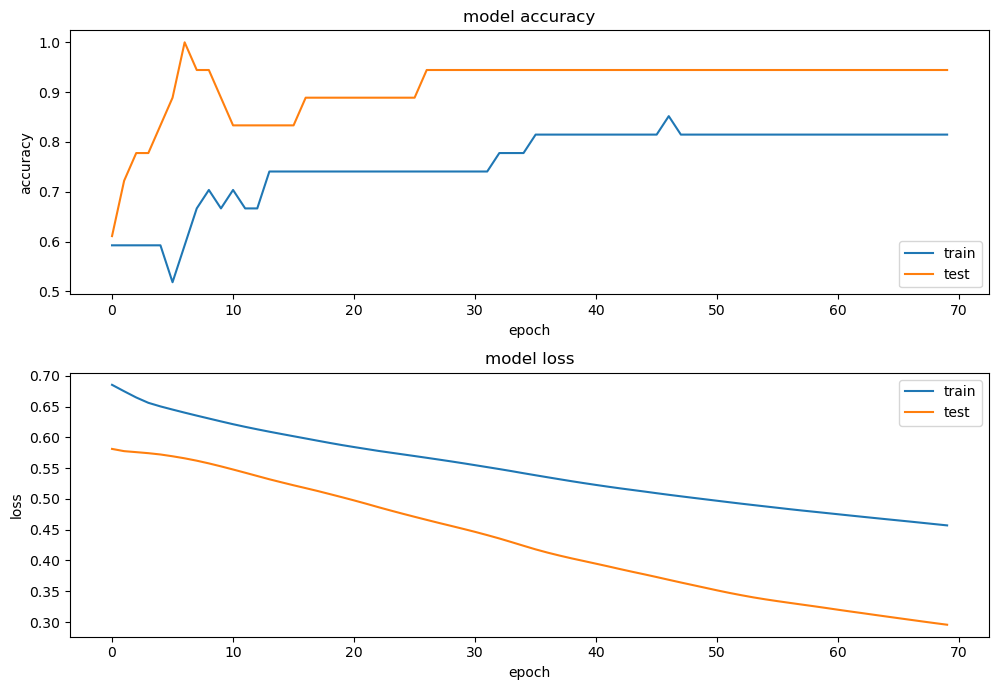

In [76]:
# plotting the metrics
plt.figure(figsize=(10, 7))
plt.subplot(2,1,1)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='lower right')

plt.subplot(2,1,2)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper right')
plt.tight_layout()

In [77]:
predicted_classes = np.argmax(model2.predict(X_test),axis=0)
print(predicted_classes)

1/1 [==============================] - 0s 17ms/step
[ 0 10]


### MI no feature selection and wavelet transform [ rest left right ]

In [129]:
from sklearn.preprocessing import OneHotEncoder

In [130]:
encoder = OneHotEncoder(sparse=False)

y_one_hot = encoder.fit_transform(np.array(labels).reshape(-1, 1))

In [131]:
wt_shape = train_data_cwt.shape
X_train, X_test, y_train, y_test = train_test_split(np.reshape(train_data_cwt,(wt_shape[0],wt_shape[1]*wt_shape[2]*wt_shape[3])), y_nonmi, test_size=0.2, random_state=42)
print(np.shape(X_train), np.shape(X_test), np.shape(y_train), np.shape(y_test))

(69, 44856) (18, 44856) (69,) (18,)


In [132]:
target = ['rest','left','right']

#### **Logistic Regression**

In [133]:
# Create and fit the logistic regression model within a pipeline
def logistic_regression(X_train, X_test, y_train, y_test, target):
    print("============ logistic_regression ============")
    clf = Pipeline([('LR', LogisticRegression())])
    clf.fit(X_train, y_train)
    
    # Predict and calculate accuracy
    y_pred = clf.predict(X_test)
    report(y_test, y_pred, target)
    print()
    
logistic_regression(X_train, X_test, y_train, y_test, target)

============ logistic_regression ============
Accuracy: 0.3333333333333333
precision: 0.6425925925925926
recall: 0.3333333333333333
f1_score: 0.27720922677063026
              precision    recall  f1-score   support

        rest       0.27      1.00      0.42         4
        left       0.50      0.14      0.22         7
       right       1.00      0.14      0.25         7

    accuracy                           0.33        18
   macro avg       0.59      0.43      0.30        18
weighted avg       0.64      0.33      0.28        18

Confusion matrix 
[[4 0 0]
 [6 1 0]
 [5 1 1]]



#### **Support Vector Machine**

In [134]:
def svm(X_train, X_test, y_train, y_test, target, kernel='linear',gamma = 'auto'):
    print("============ Support Vector Machine (SVM) kernel("+kernel+") gamma("+str(gamma)+") ============")
    clf = Pipeline([('SVM', SVC(kernel=kernel, gamma=gamma))])  
    clf.fit(X_train, y_train)

    y_pred = clf.predict(X_test)
    report(y_test, y_pred, target)
    print()

svm(X_train, X_test, y_train, y_test, target)

============ Support Vector Machine (SVM) kernel(linear) gamma(auto) ============
Accuracy: 0.2777777777777778
precision: 0.25
recall: 0.2777777777777778
f1_score: 0.17530864197530865
              precision    recall  f1-score   support

        rest       0.25      1.00      0.40         4
        left       0.50      0.14      0.22         7
       right       0.00      0.00      0.00         7

    accuracy                           0.28        18
   macro avg       0.25      0.38      0.21        18
weighted avg       0.25      0.28      0.18        18

Confusion matrix 
[[4 0 0]
 [6 1 0]
 [6 1 0]]



In [135]:
svm(X_train, X_test, y_train, y_test, target, kernel='rbf',gamma=0.5)

============ Support Vector Machine (SVM) kernel(rbf) gamma(0.5) ============
Accuracy: 0.2222222222222222
precision: 0.04938271604938271
recall: 0.2222222222222222
f1_score: 0.0808080808080808
              precision    recall  f1-score   support

        rest       0.22      1.00      0.36         4
        left       0.00      0.00      0.00         7
       right       0.00      0.00      0.00         7

    accuracy                           0.22        18
   macro avg       0.07      0.33      0.12        18
weighted avg       0.05      0.22      0.08        18

Confusion matrix 
[[4 0 0]
 [7 0 0]
 [7 0 0]]



#### **Linear Discriminant Analysis**

In [136]:
def lda(X_train, X_test, y_train, y_test, target):
    print("============ Linear Discriminant Analysis (LDA) ============")
    clf = Pipeline([('LDA', LDA())])
    clf.fit(X_train, y_train)

    y_pred = clf.predict(X_test)
    report(y_test, y_pred, target)
    print()
    
lda(X_train, X_test, y_train, y_test, target)

============ Linear Discriminant Analysis (LDA) ============
Accuracy: 0.3333333333333333
precision: 0.6425925925925926
recall: 0.3333333333333333
f1_score: 0.27720922677063026
              precision    recall  f1-score   support

        rest       0.27      1.00      0.42         4
        left       0.50      0.14      0.22         7
       right       1.00      0.14      0.25         7

    accuracy                           0.33        18
   macro avg       0.59      0.43      0.30        18
weighted avg       0.64      0.33      0.28        18

Confusion matrix 
[[4 0 0]
 [6 1 0]
 [5 1 1]]



#### **k-NN K Neighbors Classifier**

In [137]:
def knn(X_train, X_test, y_train, y_test, target):
    print("============ K-Nearest Neighbors (KNN) ============")
    clf = KNeighborsClassifier(n_neighbors=3)
    clf.fit(X_train, y_train)

    y_pred = clf.predict(X_test)
    report(y_test, y_pred, target)
    print()

knn(X_train, X_test, y_train, y_test, target)

============ K-Nearest Neighbors (KNN) ============
Accuracy: 0.3333333333333333
precision: 0.3111111111111111
recall: 0.3333333333333333
f1_score: 0.3167420814479638
              precision    recall  f1-score   support

        rest       0.00      0.00      0.00         4
        left       0.30      0.43      0.35         7
       right       0.50      0.43      0.46         7

    accuracy                           0.33        18
   macro avg       0.27      0.29      0.27        18
weighted avg       0.31      0.33      0.32        18

Confusion matrix 
[[0 4 0]
 [1 3 3]
 [1 3 3]]



#### **Multi-Layer Perceptron (MLP)**

In [138]:
def mlp(X_train, X_test, y_train, y_test, target, solver='lbfgs', hidden_layer_sizes=(50, 4), random_state=3, max_iter=210):
    print("============ Multi-layer Perceptron (MLP) ============")
    clf = MLPClassifier(solver='lbfgs', hidden_layer_sizes=(50, 4), random_state=3, max_iter=210)
    clf.fit(X_train, y_train)

    y_pred = clf.predict(X_test)
    report(y_test, y_pred, target)
    print()
    
mlp(X_train, X_test, y_train, y_test, target)

============ Multi-layer Perceptron (MLP) ============
Accuracy: 0.2777777777777778
precision: 0.4411764705882353
recall: 0.2777777777777778
f1_score: 0.18187830687830686
              precision    recall  f1-score   support

        rest       0.24      1.00      0.38         4
        left       0.00      0.00      0.00         7
       right       1.00      0.14      0.25         7

    accuracy                           0.28        18
   macro avg       0.41      0.38      0.21        18
weighted avg       0.44      0.28      0.18        18

Confusion matrix 
[[4 0 0]
 [7 0 0]
 [6 0 1]]



#### **Convolution Neural Network (CNN)**

In [139]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D,MaxPooling2D, Flatten

#create model
model2 = Sequential()
#add model layers
model2.add(Dense(128, input_dim=wt_shape[1]*wt_shape[2]*wt_shape[3], activation='relu'))
model2.add(Dense(3, activation='softmax'))

model2.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_12 (Dense)            (None, 128)               5741696   
                                                                 
 dense_13 (Dense)            (None, 3)                 387       
                                                                 
Total params: 5,742,083
Trainable params: 5,742,083
Non-trainable params: 0
_________________________________________________________________


In [140]:
y_train_encoded = pd.get_dummies(y_train, columns=[1, 2])
y_test_encoded = pd.get_dummies(y_test, columns=[1, 2])

print(y_train_encoded)

        1      2      3
0   False   True  False
1    True  False  False
2    True  False  False
3    True  False  False
4    True  False  False
..    ...    ...    ...
64  False   True  False
65  False   True  False
66   True  False  False
67  False   True  False
68  False  False   True

[69 rows x 3 columns]


In [141]:
#compile model using accuracy to measure model performance
model2.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [142]:
#train the model
history = model2.fit(X_train, y_train_encoded, validation_data=(X_test, y_test_encoded), epochs=100)

Epoch 1/100
3/3 [==============================] - 1s 253ms/step - loss: 86.3110 - accuracy: 0.3623 - val_loss: 198.3197 - val_accuracy: 0.2222
Epoch 2/100
3/3 [==============================] - 0s 160ms/step - loss: 93.1963 - accuracy: 0.5797 - val_loss: 112.4437 - val_accuracy: 0.4444
Epoch 3/100
3/3 [==============================] - 0s 149ms/step - loss: 57.0445 - accuracy: 0.4348 - val_loss: 69.7692 - val_accuracy: 0.2222
Epoch 4/100
3/3 [==============================] - 1s 187ms/step - loss: 12.8844 - accuracy: 0.6522 - val_loss: 8.5358 - val_accuracy: 0.5000
Epoch 5/100
3/3 [==============================] - 0s 171ms/step - loss: 24.7141 - accuracy: 0.4493 - val_loss: 14.8845 - val_accuracy: 0.2778
Epoch 6/100
3/3 [==============================] - 0s 165ms/step - loss: 3.5566 - accuracy: 0.7971 - val_loss: 45.5239 - val_accuracy: 0.2778
Epoch 7/100
3/3 [==============================] - 0s 177ms/step - loss: 6.1061 - accuracy: 0.7101 - val_loss: 16.4576 - val_accuracy: 0.2778


In [143]:
score_train = model2.evaluate(X_train, y_train_encoded, verbose=0)
print("Train loss:", score_train[0])
print("Train accuracy:", score_train[1])

Train loss: 0.22575581073760986
Train accuracy: 0.8985507488250732


In [144]:
# Classification report
actual_classes_str = pd.get_dummies(y_test_encoded).idxmax(1)
actual_classes_str = pd.DataFrame(actual_classes_str, index=y_test_encoded.index)

#Predictions on the test set
predicted_classes = np.argmax(model2.predict(X_test),axis=1)
predicted_classes_str = []

for i in predicted_classes:
    if i == 0:
        predicted_classes_str.append(1)
    elif i == 1:
        predicted_classes_str.append(2)
    elif i == 2:
        predicted_classes_str.append(3)
predicted_classes_str = pd.DataFrame(predicted_classes_str,index=y_test_encoded.index)

report(actual_classes_str, predicted_classes_str, target)

1/1 [==============================] - 0s 160ms/step
Accuracy: 0.3888888888888889
precision: 0.837037037037037
recall: 0.3888888888888889
f1_score: 0.36362897985705
              precision    recall  f1-score   support

        rest       0.27      1.00      0.42         4
        left       1.00      0.14      0.25         7
       right       1.00      0.29      0.44         7

    accuracy                           0.39        18
   macro avg       0.76      0.48      0.37        18
weighted avg       0.84      0.39      0.36        18

Confusion matrix 
[[4 0 0]
 [6 1 0]
 [5 0 2]]


In [145]:
score = model2.evaluate(X_test, y_test_encoded, verbose=0)
print("Test loss:", score[0])
print("Test accuracy:", score[1])

Test loss: 20.05731964111328
Test accuracy: 0.3888888955116272


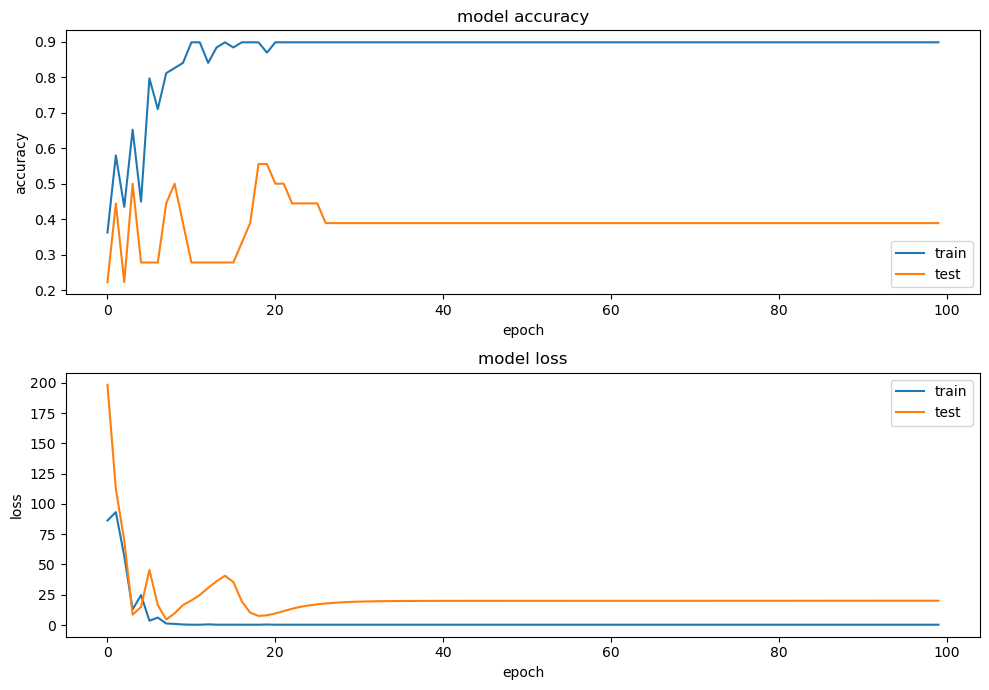

In [146]:
# plotting the metrics
plt.figure(figsize=(10, 7))
plt.subplot(2,1,1)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='lower right')

plt.subplot(2,1,2)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper right')
plt.tight_layout()

In [147]:
predicted_classes = np.argmax(model2.predict(X_test),axis=0)
print(predicted_classes)

1/1 [==============================] - 0s 174ms/step
[16  7 12]


In [148]:
from torch.utils.data import DataLoader, TensorDataset
import torch
from torch import nn

In [149]:
X_train, X_test, y_train, y_test = train_test_split(train_data_cwt, y_one_hot, test_size=0.2, random_state=42)

In [150]:
X_train = torch.tensor(X_train, dtype=torch.float32)
X_test = torch.tensor(X_test, dtype=torch.float32)
y_train = torch.tensor(y_train , dtype=torch.float32)
y_test= torch.tensor(y_test , dtype=torch.float32)

In [151]:
X_train.shape

torch.Size([69, 7, 8, 801])

In [152]:
# Create TensorDatasets for training and testing
train_dataset = TensorDataset(X_train, y_train)
test_dataset = TensorDataset(X_test, y_test)

BATCH_SIZE = 8
train_loader = DataLoader(train_dataset,  batch_size = BATCH_SIZE, shuffle=False)
test_loader= DataLoader(test_dataset,  batch_size = BATCH_SIZE, shuffle=False)

In [153]:
import torch.nn.functional as F

# Define the parameters for layer1
kernel_size_1 = (4, 4)
stride_1 = (1, 1)
padding_1 = 0

# Calculate the output size after layer1
H1 = (801 - kernel_size_1[0] + 2 * padding_1) // stride_1[0] + 1
W1 = (8 - kernel_size_1[1] + 2 * padding_1) // stride_1[1] + 1

# Define the parameters for layer2
kernel_size_2 = (1, 1)
stride_2 = (1, 1)
padding_2 = 0

# Calculate the output size after layer2
H2 = (H1 - kernel_size_2[0] + 2 * padding_2) // stride_2[0] + 1
W2 = (W1 - kernel_size_2[1] + 2 * padding_2) // stride_2[1] + 1

print("Output size after layer 1 (H1, W1):", (H1, W1))
print("Output size after layer 2 (H2, W2):", (H2, W2))

Output size after layer 1 (H1, W1): (798, 5)
Output size after layer 2 (H2, W2): (798, 5)


In [154]:
class ConvNet(nn.Module): 
    def __init__(self, num_classes=3, dropout=0.3):
        super(ConvNet, self).__init__()
        self.layer1 = nn.Sequential(
           nn.Conv2d(in_channels = 7, out_channels = 8, kernel_size = (4,4), stride = (1,1), padding = 0),
           nn.BatchNorm2d(8, affine=False),
           nn.ReLU(),
            )
        self.layer2 = nn.Sequential(
            nn.Conv2d(in_channels = 8, out_channels = 12, kernel_size = (1,1), stride = (1,1), padding = 0),
            nn.BatchNorm2d(12, affine=False),
            nn.ReLU(),
            )
        self.linear1 = nn.Sequential(
            nn.Flatten(),
            nn.Linear(12 * H2 * W2, 240),
            nn.ReLU(),
            nn.Dropout(dropout),
            )
        self.linear2 = nn.Sequential(
            nn.Linear(240 , num_classes),
        )
            
    def forward(self, x):
        out = self.layer1(x)
        out = self.layer2(out)
        out = self.linear1(out)
        out = self.linear2(out)

        return out

In [155]:
input=torch.randn(8,7,8,801) # 

model=ConvNet()
out=model(input)
out.shape

torch.Size([8, 3])

In [156]:
model = ConvNet()

In [157]:
from torchsummary import summary

summary(model, input_size= (7, 8, 801))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1            [-1, 8, 5, 798]             904
       BatchNorm2d-2            [-1, 8, 5, 798]               0
              ReLU-3            [-1, 8, 5, 798]               0
            Conv2d-4           [-1, 12, 5, 798]             108
       BatchNorm2d-5           [-1, 12, 5, 798]               0
              ReLU-6           [-1, 12, 5, 798]               0
           Flatten-7                [-1, 47880]               0
            Linear-8                  [-1, 240]      11,491,440
              ReLU-9                  [-1, 240]               0
          Dropout-10                  [-1, 240]               0
           Linear-11                    [-1, 3]             723
Total params: 11,493,175
Trainable params: 11,493,175
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.17
Fo

In [158]:
import requests
from pathlib import Path

# Download helper functions from Learn PyTorch repo
if Path("helper_functions.py").is_file():
  print("helper_functions.py already exists, skipping download...")
else:
  print("Downloading helper_functions.py")
  request = requests.get("https://raw.githubusercontent.com/mrdbourke/pytorch-deep-learning/main/helper_functions.py")
  with open("helper_functions.py", "wb") as f:
    f.write(request.content)

helper_functions.py already exists, skipping download...


In [159]:
# Import accuracy metric
from helper_functions import accuracy_fn
# Setuo loss function and optimizer
loss_fn = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(params=model.parameters(),lr= 0.000003)

In [160]:
from timeit import default_timer as timer
def print_train_time(start: float, end: float, device: torch.device = None):
    """ Prints difference between start and end time."""
    total_time = end-start
    print(f"Train time on {device}: {total_time:.3f} seconds")
    return total_time

In [161]:
from tqdm.auto import tqdm
from sklearn.metrics import classification_report
# Set the seed and start the timer
torch.manual_seed(42)
train_time_start_on_cpu = timer()

epochs = 30

train_losses = []
train_accs = []
test_losses = []
test_accs = []



for epoch in tqdm(range(epochs)):
    print(f"Epoch: {epoch}\n-----")
    ### Training
    train_loss = 0
    train_acc = 0
    true_labels = []
    predicted_labels = []
    for batch, (X, y) in enumerate(train_loader):
        model.train()
        # 1. Forward pass
        train_logits = model(X)
        # 2. Calculate the loss (per batch)
        # print(y_pred, y)
        loss = loss_fn(train_logits, y)
        train_loss +=  loss 

        # 3. Optimizer zero grad
        optimizer.zero_grad()

        # 4. Loss backward
        loss.backward()

        # 5. Optimizer step
        optimizer.step()
        train_pred = torch.softmax(train_logits, dim=1).argmax(dim = 1)
        train_acc += accuracy_fn(y.argmax(dim=1), train_pred)



    # Divide total train loss by length of train dataloader
    train_loss /= len(train_loader)
    train_acc /= len(train_loader)
    train_losses.append(train_loss)
    train_accs.append(train_acc)

    ### Testing
    test_loss, test_acc = 0, 0
    model.eval()
    with torch.no_grad():
        for X_test, y_test in test_loader:
            print(y_test.shape)
            test_logits = model(X_test)
            test_pred = torch.softmax(test_logits, dim=1).argmax(dim = 1)
            test_loss += loss_fn(test_logits, y_test).item()
            test_acc += accuracy_fn(y_test.argmax(dim=1), test_pred)
            # print(y_test.argmax(dim=1), test_pred)

            # print(y_test.argmax(dim=1), test_pred)
            true_labels.extend(y_test.cpu().numpy())  # Append true labels
            predicted_labels.extend(test_pred.cpu().numpy())  # Append predicted labels

            

        test_loss /= len(test_loader)
        test_acc /= len(test_loader)
        test_losses.append(test_loss)
        test_accs.append(test_acc)

    print(f"Train loss: {train_loss:.4f} Train acc: {train_acc:.4f} | Test loss: {test_loss:.4f}, Test acc: {test_acc:.4f}")

train_time_end_on_cpu =  timer()
total_train_time_model = print_train_time(start=train_time_start_on_cpu, end= train_time_end_on_cpu, device=str(next(model.parameters()).device))
# Check f1-score **

  0%|          | 0/30 [00:00<?, ?it/s]

Epoch: 0
-----
torch.Size([8, 3])
torch.Size([8, 3])
torch.Size([2, 3])
Train loss: 1.0776 Train acc: 35.5556 | Test loss: 1.1131, Test acc: 29.1667
Epoch: 1
-----
torch.Size([8, 3])
torch.Size([8, 3])
torch.Size([2, 3])
Train loss: 0.9438 Train acc: 55.0000 | Test loss: 1.1510, Test acc: 29.1667
Epoch: 2
-----
torch.Size([8, 3])
torch.Size([8, 3])
torch.Size([2, 3])
Train loss: 0.8442 Train acc: 53.6111 | Test loss: 1.1979, Test acc: 29.1667
Epoch: 3
-----
torch.Size([8, 3])
torch.Size([8, 3])
torch.Size([2, 3])
Train loss: 0.8045 Train acc: 57.7778 | Test loss: 1.2320, Test acc: 29.1667
Epoch: 4
-----
torch.Size([8, 3])
torch.Size([8, 3])
torch.Size([2, 3])
Train loss: 0.7559 Train acc: 61.3889 | Test loss: 1.2387, Test acc: 29.1667
Epoch: 5
-----
torch.Size([8, 3])
torch.Size([8, 3])
torch.Size([2, 3])
Train loss: 0.7213 Train acc: 74.7222 | Test loss: 1.2386, Test acc: 29.1667
Epoch: 6
-----
torch.Size([8, 3])
torch.Size([8, 3])
torch.Size([2, 3])
Train loss: 0.6569 Train acc: 81.9

In [162]:
argmax_indices = [np.argmax(arr) for arr in true_labels]

In [163]:
classification_rep = classification_report(argmax_indices, predicted_labels)
print(classification_rep)

              precision    recall  f1-score   support

           0       0.25      1.00      0.40         4
           1       0.50      0.14      0.22         7
           2       0.00      0.00      0.00         7

    accuracy                           0.28        18
   macro avg       0.25      0.38      0.21        18
weighted avg       0.25      0.28      0.18        18



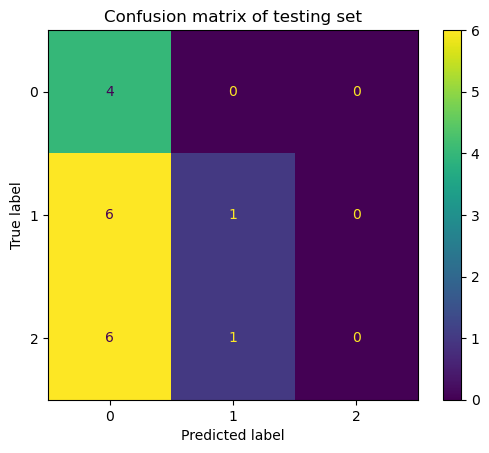

In [164]:
# Plot confusion matrix of training set
from sklearn.metrics import ConfusionMatrixDisplay

cm = confusion_matrix(y_true=argmax_indices , y_pred=predicted_labels)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=list(set(argmax_indices)))
disp.plot()
plt.title('Confusion matrix of testing set')
plt.show()

In [165]:
print(train_losses)
print(train_accs)
print(test_losses)
print(test_accs)

[tensor(1.0776, grad_fn=<DivBackward0>), tensor(0.9438, grad_fn=<DivBackward0>), tensor(0.8442, grad_fn=<DivBackward0>), tensor(0.8045, grad_fn=<DivBackward0>), tensor(0.7559, grad_fn=<DivBackward0>), tensor(0.7213, grad_fn=<DivBackward0>), tensor(0.6569, grad_fn=<DivBackward0>), tensor(0.6236, grad_fn=<DivBackward0>), tensor(0.5815, grad_fn=<DivBackward0>), tensor(0.5480, grad_fn=<DivBackward0>), tensor(0.5143, grad_fn=<DivBackward0>), tensor(0.4922, grad_fn=<DivBackward0>), tensor(0.4863, grad_fn=<DivBackward0>), tensor(0.4377, grad_fn=<DivBackward0>), tensor(0.4157, grad_fn=<DivBackward0>), tensor(0.4140, grad_fn=<DivBackward0>), tensor(0.4016, grad_fn=<DivBackward0>), tensor(0.3873, grad_fn=<DivBackward0>), tensor(0.3534, grad_fn=<DivBackward0>), tensor(0.3547, grad_fn=<DivBackward0>), tensor(0.3393, grad_fn=<DivBackward0>), tensor(0.3490, grad_fn=<DivBackward0>), tensor(0.3218, grad_fn=<DivBackward0>), tensor(0.3297, grad_fn=<DivBackward0>), tensor(0.3124, grad_fn=<DivBackward0>),

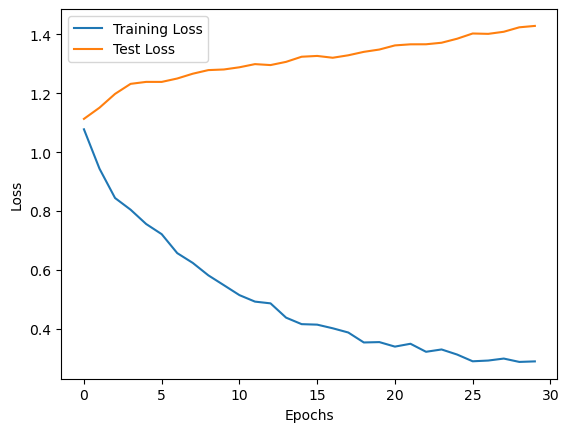

In [166]:
# Convert the tensors to NumPy arrays
data_np = [x.item() for x in train_losses]

# Create a list of x-values (assuming x values are from 0 to len(data)-1)
x_values = range(len(train_losses))

# Plot the data
plt.plot(x_values, data_np, linestyle='-', label='Training Loss')
plt.plot(x_values, test_losses,  linestyle='-', label='Test Loss')

plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()  
plt.show()

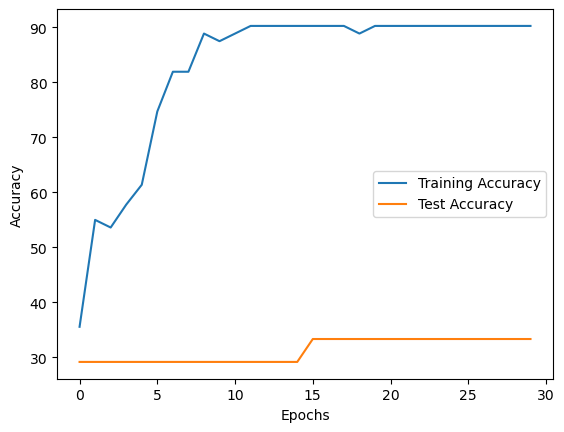

In [167]:

# Create a list of x-values (assuming x values are from 0 to len(data)-1)
x_values = range(len(train_losses))

plt.plot(x_values, train_accs, linestyle='-', label='Training Accuracy')
plt.plot(x_values, test_accs, linestyle='-', label='Test Accuracy')

plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()  
plt.show()

## Conclusion

It is possible to distinguish between left-right motor imagery classes, but there is an issue with classifying between Motor Imagery and Non-Motor Imagery. This poses a challenge in separating the differences between resting periods and periods of imagination.

This file is visualization every process step in signal processing.